In [5]:
import pandas as pd
import numpy as np
import utilsClust
from importlib import reload
import math
import matplotlib.pyplot as plt
import seaborn as sns
from clusterian import enrich, misc
import os
from itertools import chain

In [2]:
reload(utilsClust)

<module 'utilsClust' from '/home/ldap/ipellet/Documents/Clustering/utilsClust.py'>

# Data

In [3]:
reactome = pd.read_csv('../Matrices/Reactome.peDbId.matrix.csv', index_col=0)
reactome.shape

(30933, 1943)

In [4]:
g2v = pd.read_csv('../data/gene2vec_dim_200_iter_9.csv', index_col=0)

In [5]:
rna = pd.read_csv('../data/RNAseqData.csv', index_col=0).transpose()

In [6]:
datasets = {'rna':rna, 'g2v':g2v}

In [18]:
symbols = pd.read_csv('../Matrices/MSigDB.c2.cp.v7.5.1.symbols.matrix.csv', index_col=0)

In [21]:
symbols_bis = symbols.loc[np.sum(symbols, axis=1)>0,np.sum(symbols, axis=0)>0]

In [26]:
reactome_c = []
for c in symbols_bis.columns:
    if "REACTOME" in c:
        reactome_c.append(c)

In [27]:
len(reactome_c)

1615

In [28]:
symbols_reactome = symbols.loc[:,reactome_c]

In [33]:
symbols_reactome

,REACTOME_INTERLEUKIN_6_SIGNALING,REACTOME_APOPTOSIS,REACTOME_HEMOSTASIS,REACTOME_INTRINSIC_PATHWAY_FOR_APOPTOSIS,REACTOME_MAPK3_ERK1_ACTIVATION,REACTOME_TRANSLESION_SYNTHESIS_BY_Y_FAMILY_DNA_POLYMERASES_BYPASSES_LESIONS_ON_DNA_TEMPLATE,REACTOME_RECOGNITION_OF_DNA_DAMAGE_BY_PCNA_CONTAINING_REPLICATION_COMPLEX,REACTOME_TRANSLESION_SYNTHESIS_BY_POLH,REACTOME_RECOGNITION_AND_ASSOCIATION_OF_DNA_GLYCOSYLASE_WITH_SITE_CONTAINING_AN_AFFECTED_PURINE,REACTOME_DISPLACEMENT_OF_DNA_GLYCOSYLASE_BY_APEX1,...,REACTOME_GABA_B_RECEPTOR_ACTIVATION,REACTOME_GROWTH_HORMONE_RECEPTOR_SIGNALING,REACTOME_ANTIGEN_PROCESSING_UBIQUITINATION_PROTEASOME_DEGRADATION,REACTOME_CLASS_I_MHC_MEDIATED_ANTIGEN_PROCESSING_PRESENTATION,REACTOME_ANTIGEN_PRESENTATION_FOLDING_ASSEMBLY_AND_PEPTIDE_LOADING_OF_CLASS_I_MHC,REACTOME_KINESINS,REACTOME_FACTORS_INVOLVED_IN_MEGAKARYOCYTE_DEVELOPMENT_AND_PLATELET_PRODUCTION,REACTOME_ANTIGEN_ACTIVATES_B_CELL_RECEPTOR_BCR_LEADING_TO_GENERATION_OF_SECOND_MESSENGERS,REACTOME_SIGNALING_BY_THE_B_CELL_RECEPTOR_BCR,REACTOME_ION_CHANNEL_TRANSPORT
A1BG,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
A1CF,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
A2M,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
A2ML1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
A3GALT2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZYG11A,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ZYG11B,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ZYX,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ZZEF1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [31]:
symbols_reactome_bis = symbols_reactome.loc[np.sum(symbols_reactome, axis=1)>0,:]

In [32]:
symbols_reactome_bis

,REACTOME_INTERLEUKIN_6_SIGNALING,REACTOME_APOPTOSIS,REACTOME_HEMOSTASIS,REACTOME_INTRINSIC_PATHWAY_FOR_APOPTOSIS,REACTOME_MAPK3_ERK1_ACTIVATION,REACTOME_TRANSLESION_SYNTHESIS_BY_Y_FAMILY_DNA_POLYMERASES_BYPASSES_LESIONS_ON_DNA_TEMPLATE,REACTOME_RECOGNITION_OF_DNA_DAMAGE_BY_PCNA_CONTAINING_REPLICATION_COMPLEX,REACTOME_TRANSLESION_SYNTHESIS_BY_POLH,REACTOME_RECOGNITION_AND_ASSOCIATION_OF_DNA_GLYCOSYLASE_WITH_SITE_CONTAINING_AN_AFFECTED_PURINE,REACTOME_DISPLACEMENT_OF_DNA_GLYCOSYLASE_BY_APEX1,...,REACTOME_GABA_B_RECEPTOR_ACTIVATION,REACTOME_GROWTH_HORMONE_RECEPTOR_SIGNALING,REACTOME_ANTIGEN_PROCESSING_UBIQUITINATION_PROTEASOME_DEGRADATION,REACTOME_CLASS_I_MHC_MEDIATED_ANTIGEN_PROCESSING_PRESENTATION,REACTOME_ANTIGEN_PRESENTATION_FOLDING_ASSEMBLY_AND_PEPTIDE_LOADING_OF_CLASS_I_MHC,REACTOME_KINESINS,REACTOME_FACTORS_INVOLVED_IN_MEGAKARYOCYTE_DEVELOPMENT_AND_PLATELET_PRODUCTION,REACTOME_ANTIGEN_ACTIVATES_B_CELL_RECEPTOR_BCR_LEADING_TO_GENERATION_OF_SECOND_MESSENGERS,REACTOME_SIGNALING_BY_THE_B_CELL_RECEPTOR_BCR,REACTOME_ION_CHANNEL_TRANSPORT
A1BG,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
A1CF,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
A2M,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
A4GNT,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AAAS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSWIM8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ZW10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ZWILCH,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ZWINT,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [17]:
reactome

,15869,68616,68689,68867,68875,68877,68881,68882,68884,68886,...,9754706,9755511,9755779,9758881,9758890,9759194,9759218,9762114,9763198,9767675
48888,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
49155,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
49189,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
49191,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
49291,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9766436,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9766524,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9766536,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9766647,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# Cluster content

In [106]:
WGCNA_rna = pd.read_csv("MembMatrix/rm/WGCNA_rna_ch0.05.csv", index_col=0)

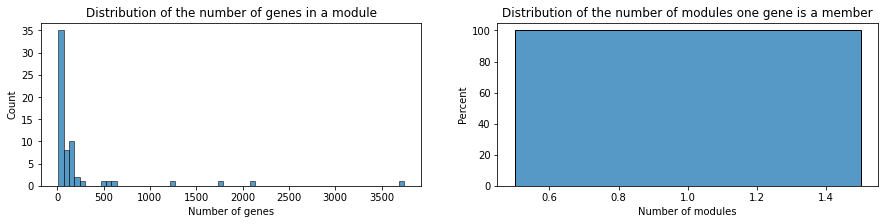

Number of genes in a module : 
- Mean : 235.06 
- Median : 66.0 
- Max : 3744 
- Min : 11 

Number of modules per gene : 
- Mean : 1.00 
- Median : 1.0 
- Max : 1 
- Min : 1 

0.00 % of genes are not included in any module.
100.00 % of genes are included in only one module.
0.00 % of genes are included in more than one module.


In [107]:
WGCNA_rna_GpM,WGCNA_rna_MpG = utilsClust.Overlap(WGCNA_rna)

In [108]:
WGCNA_rna_GpM[0]/WGCNA_rna.shape[0]*100

3.504625565534472

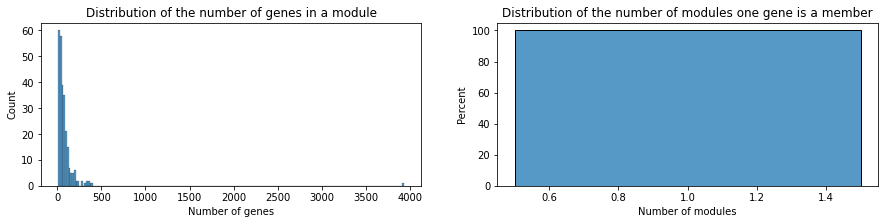

Number of genes in a module : 
- Mean : 92.25 
- Median : 57.0 
- Max : 3928 
- Min : 11 

Number of modules per gene : 
- Mean : 1.00 
- Median : 1.0 
- Max : 1 
- Min : 1 

0.00 % of genes are not included in any module.
100.00 % of genes are included in only one module.
0.00 % of genes are included in more than one module.


In [104]:
WGCNA_g2v = pd.read_csv("./MembMatrix/rm/WGCNA_g2v_ch0.10.csv", index_col=0)
WGCNA_g2v_GpM,WGCNA_g2v_MpG = utilsClust.Overlap(WGCNA_g2v)

Label 0 is reserved for genes outside of all modules.

In [105]:
WGCNA_g2v_GpM[0]/WGCNA_g2v.shape[0]*100

16.067411134290506

16% of genes are not in any module

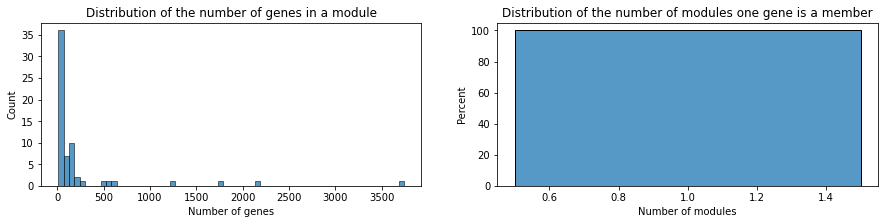

Number of genes in a module : 
- Mean : 235.06 
- Median : 64.0 
- Max : 3742 
- Min : 11 

Number of modules per gene : 
- Mean : 1.00 
- Median : 1.0 
- Max : 1 
- Min : 1 

0.00 % of genes are not included in any module.
100.00 % of genes are included in only one module.
0.00 % of genes are included in more than one module.


In [51]:
WGCNA_rna_ch005_signedTOM = pd.read_csv("WGCNA_rna_ch0.05_signedTOM.csv", index_col=0)
WGCNA_rna_ch005_signedTOM_GpM,WGCNA_rna_ch005_signedTOM_MpG = utilsClust.Overlap(WGCNA_rna_ch005_signedTOM)

In [52]:
WGCNA_rna_ch005_signedTOM_GpM[0]/WGCNA_rna_ch005_signedTOM.shape[0]*100

3.5181308663650483

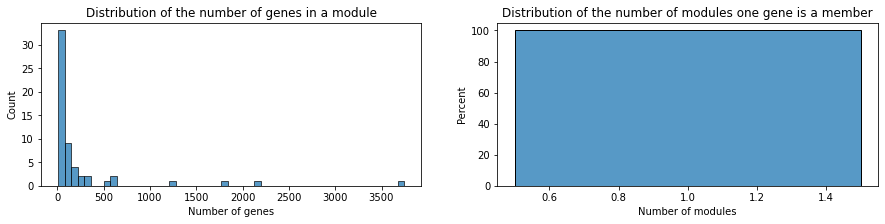

Number of genes in a module : 
- Mean : 259.81 
- Median : 66.0 
- Max : 3744 
- Min : 11 

Number of modules per gene : 
- Mean : 1.00 
- Median : 1.0 
- Max : 1 
- Min : 1 

0.00 % of genes are not included in any module.
100.00 % of genes are included in only one module.
0.00 % of genes are included in more than one module.
3.504625565534472
57


In [41]:
WGCNA_ = pd.read_csv("WGCNA_rna_ch0.10.csv", index_col=0)
WGCNA_GpM,WGCNA_MpG = utilsClust.Overlap(WGCNA_)
print(WGCNA_GpM[0]/WGCNA_.shape[0]*100)
print(len(WGCNA_GpM))

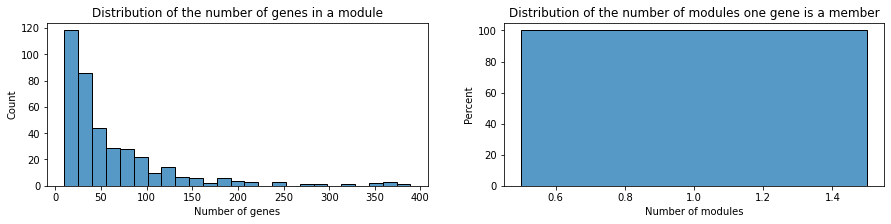

Number of genes in a module : 
- Mean : 62.52 
- Median : 38.0 
- Max : 389 
- Min : 10 

Number of modules per gene : 
- Mean : 1.00 
- Median : 1.0 
- Max : 1 
- Min : 1 

0.00 % of genes are not included in any module.
100.00 % of genes are included in only one module.
0.00 % of genes are included in more than one module.


In [110]:
WGCNA_g2v_rcl = pd.read_csv("./MembMatrix/WGCNA_g2v_ch0.10_recl0.csv", index_col=0)
WGCNA_g2v_GpM_rcl,WGCNA_g2v_MpG_rcl = utilsClust.Overlap(WGCNA_g2v_rcl)

In [111]:
WGCNA_g2v_GpM_rcl[0]/WGCNA_g2v_rcl.shape[0]*100

0.556305477154661

In [114]:
WGCNA_g2v_rcl.shape

(24447, 391)

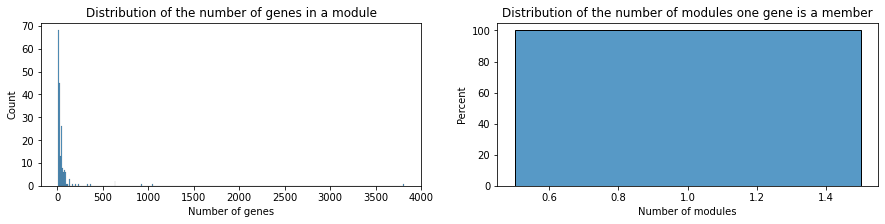

Number of genes in a module : 
- Mean : 75.94 
- Median : 25.0 
- Max : 3812 
- Min : 10 

Number of modules per gene : 
- Mean : 1.00 
- Median : 1.0 
- Max : 1 
- Min : 1 

0.00 % of genes are not included in any module.
100.00 % of genes are included in only one module.
0.00 % of genes are included in more than one module.


In [112]:
WGCNA_rna_rcl = pd.read_csv("./MembMatrix/WGCNA_rna_ch0.01_2rcl_rcl0.csv", index_col=0)
WGCNA_rna_GpM_rcl,WGCNA_rna_MpG_rcl = utilsClust.Overlap(WGCNA_rna_rcl)

In [113]:
WGCNA_rna_GpM_rcl[0]/WGCNA_rna_rcl.shape[0]*100

0.904855155648592

In [115]:
WGCNA_rna_rcl.shape

(14809, 195)

In [6]:
for root, dirs, mm_files in os.walk('./MembMatrix/'):
    break
    
mm_files

['ICA_rna_1e-2.csv',
 'KMeans_g2v_200.csv',
 'SOM_rna_square_letremy_letremy_standard.csv',
 'WGCNA_g2v_ch0.10_recl0.csv',
 'HC_rna_201.csv',
 'KMeans_rna_200.csv',
 'GM_g2v_200_full.csv',
 'PAM_rna_200.csv',
 'SOM_g2v_square_gaussian_canberra_standard.csv',
 'PAM_g2v_200.csv',
 'HC_g2v_200.csv',
 'FLAME_g2v_6nn_1e-15.csv',
 'FLAME_rna_4n_1e-15.csv',
 'ICA_g2v_1e-6.csv',
 'GM_rna_200_full.csv',
 'WGCNA_rna_ch0.01_2rcl_rcl0.csv']

In [185]:
GpC_dic = {}
GpC_df_ = []
for f in mm_files:
    sol = '_'.join(f.split('_')[:2])
    mm = misc.load_mm(os.path.join('MembMatrix',f))
    df = pd.DataFrame([[sol]*mm.shape[1],np.sum(mm, axis=0)], index=['sol', 'n_genes']).T
    GpC_df_.append(df)
    GpC_dic[sol] = pd.Series(np.sum(mm, axis=0))

In [155]:
GpC_df = pd.concat(GpC_df_)

In [490]:
sol = 'reactome'
mm = pd.read_csv('../Matrices/MSigDB_Reactome.csv', index_col=0)
df = pd.DataFrame([[sol]*mm.shape[1],np.sum(mm, axis=0)], index=['sol', 'n_genes']).T
GpC_df_.append(df)
GpC_dic[sol] = pd.Series(np.sum(mm, axis=0))

In [491]:
GpC_df_bis = pd.DataFrame(GpC_dic)

In [492]:
sol_overlap = ['ICA_rna','ICA_g2v','FLAME_rna','FLAME_g2v']

In [513]:
sol_out = ['WGCNA_rna', 'SOM_g2v']

In [514]:
i_ovelap = np.array([False]*GpC_df.shape[0])
i_out = np.array([False]*GpC_df.shape[0])
i_else = np.array([True]*GpC_df.shape[0])
for i,s in enumerate(GpC_df.loc[:,'sol']):
    if s in sol_overlap:
        i_ovelap[i] = True
        i_else[i] = False
    elif s in sol_out:
        i_out[i] = True
        i_else[i] = False

In [515]:
GpC_overlap = GpC_df.loc[i_ovelap,:]
GpC_noOverlap = GpC_df.loc[~i_ovelap,:]

In [516]:
sol_else = GpC_df_bis.columns.values.tolist()
for s in sol_overlap:
    sol_else.remove(s)
for s in sol_out:
    sol_else.remove(s)

In [517]:
sol_else

['KMeans_g2v',
 'SOM_rna',
 'WGCNA_g2v',
 'HC_rna',
 'KMeans_rna',
 'GM_g2v',
 'PAM_rna',
 'PAM_g2v',
 'HC_g2v',
 'GM_rna',
 'reactome']

In [518]:
sorted_index

Index(['reactome', 'WGCNA_rna', 'SOM_g2v'], dtype='object')

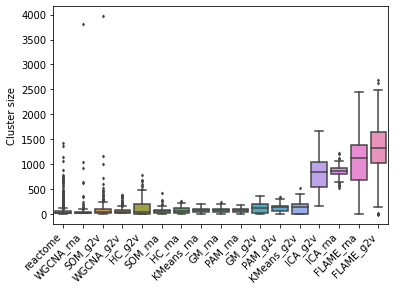

In [530]:
df = GpC_df_bis
sorted_index = df.median().sort_values(ascending=True).index
df_sorted=df[sorted_index]
g = sns.boxplot(data=df_sorted, showfliers = True, fliersize=2)
g.set_xticklabels(g.get_xticklabels(), rotation=45, ha='right')
g.set_ylabel('Cluster size');

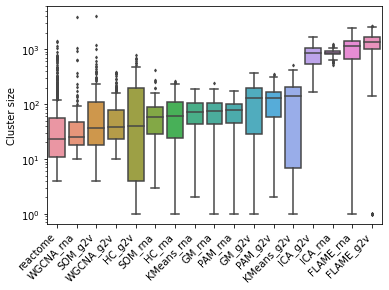

In [531]:
df = GpC_df_bis
sorted_index = df.median().sort_values(ascending=True).index
df_sorted=df[sorted_index]
g = sns.boxplot(data=df_sorted, showfliers = True, fliersize=2)
g.set_xticklabels(g.get_xticklabels(), rotation=45, ha='right')
g.set_ylabel('Cluster size');
g.set_yscale('log');

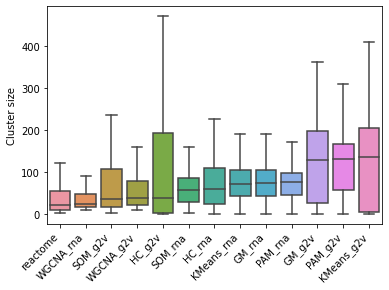

In [533]:
df = GpC_df_bis.loc[:,sol_out+sol_else]
sorted_index = df.median().sort_values(ascending=True).index
df_sorted=df[sorted_index]
g = sns.boxplot(data=df_sorted, showfliers = False)
g.set_xticklabels(g.get_xticklabels(), rotation=45, ha='right')
g.set_ylabel('Cluster size');

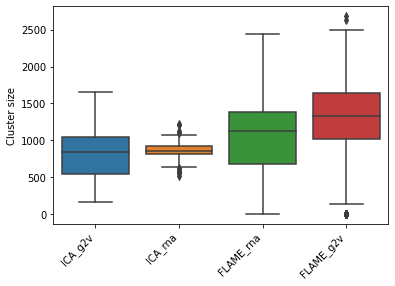

In [535]:
df = GpC_df_bis.loc[:,sol_overlap]
sorted_index = df.median().sort_values(ascending=True).index
df_sorted=df[sorted_index]
g = sns.boxplot(data=df_sorted, showfliers = True)
g.set_xticklabels(g.get_xticklabels(), rotation=45, ha='right')
g.set_ylabel('Cluster size');

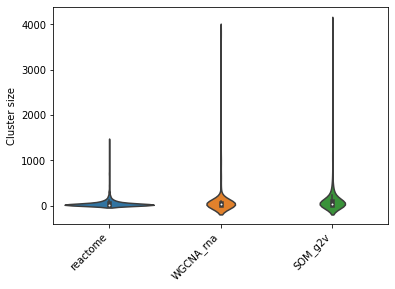

In [512]:
df = GpC_df_bis.loc[:,sol_out]
sorted_index = df.median().sort_values(ascending=True).index
df_sorted=df[sorted_index]
g = sns.violinplot(data=df_sorted)#, showfliers = False)
g.set_xticklabels(g.get_xticklabels(), rotation=45, ha='right')
g.set_ylabel('Cluster size');

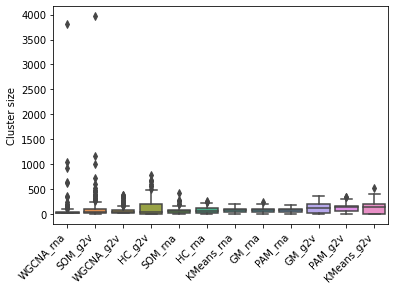

In [480]:
df = GpC_df_bis.loc[:,sol_noOverlap]
sorted_index = df.median().sort_values(ascending=True).index
df_sorted=df[sorted_index]
g = sns.boxplot(data=df_sorted)#, showfliers = False)
g.set_xticklabels(g.get_xticklabels(), rotation=45, ha='right')
g.set_ylabel('Cluster size');

In [121]:
plt.rcParams['figure.figsize'] = fsizeinit
for i,m in enumerate(metrics):    
    plt.clf()
    g = sns.boxplot( x=all_res["Sol"], y=all_res[m], order=order.index)
    g.set_xticklabels(g.get_xticklabels(), rotation=45, ha='right')
    med = np.median(all_res[m])
    plt.hlines(med, ls='--', xmin=ax.get_xlim()[0], xmax=ax.get_xlim()[1], color = '0', lw=2)
    #ax.set_ylim((-1,1))
    plt.xlabel("Sol", visible=False)
    #if i//nCol != nrow-1:
    #    plt.setp(ax.get_xticklabels(), visible=False)
    plt.savefig('../img/NN_'+str(m)+'_boxplot.png', transparent=True, bbox_inches='tight')

<module 'seaborn' from '/home/ldap/ipellet/anaconda3/lib/python3.9/site-packages/seaborn/__init__.py'>

In [7]:
mm_dict = {}
for f in mm_files:
    sol = '_'.join(f.split('_')[:2])
    mm = misc.load_mm(os.path.join('MembMatrix',f))
    mm_dict[sol] = mm

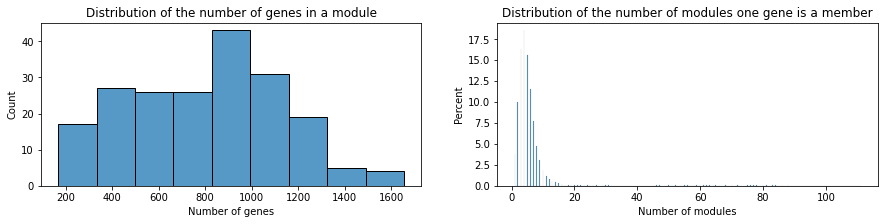

Number of genes in a module : 
- Mean : 808.95 
- Median : 836.0 
- Max : 1655 
- Min : 168 

Number of modules per gene : 
- Mean : 6.60 
- Median : 5.0 
- Max : 111 
- Min : 1 

0.00 % of genes are not included in any module.
3.75 % of genes are included in only one module.
96.25 % of genes are included in more than one module.


In [550]:
mm = mm_dict['ICA_g2v']
mm_filt = mm.loc[np.sum(mm,axis=1)>0,np.sum(mm,axis=0)>0]
utilsClust.Overlap(mm_filt);

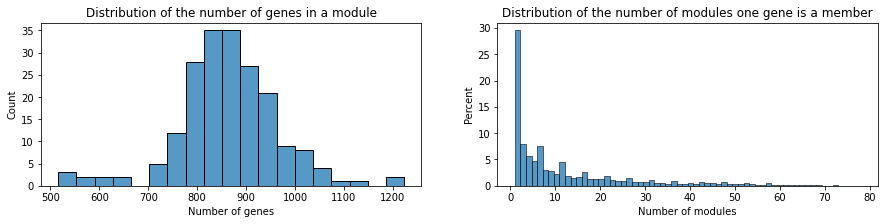

Number of genes in a module : 
- Mean : 862.67 
- Median : 856.0 
- Max : 1223 
- Min : 516 

Number of modules per gene : 
- Mean : 12.21 
- Median : 6.0 
- Max : 78 
- Min : 1 

0.00 % of genes are not included in any module.
17.92 % of genes are included in only one module.
82.08 % of genes are included in more than one module.


In [547]:
mm = mm_dict['ICA_rna']
mm_filt = mm.loc[np.sum(mm,axis=1)>0,np.sum(mm,axis=0)>0]
utilsClust.Overlap(mm_filt);

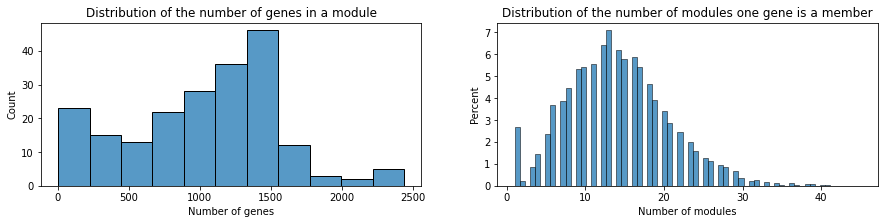

Number of genes in a module : 
- Mean : 1018.64 
- Median : 1122.0 
- Max : 2439 
- Min : 1 

Number of modules per gene : 
- Mean : 14.11 
- Median : 14.0 
- Max : 45 
- Min : 1 

0.00 % of genes are not included in any module.
2.67 % of genes are included in only one module.
97.33 % of genes are included in more than one module.
# cl 205


In [347]:
mm = mm_dict['FLAME_rna']
mm_filt = mm.loc[np.sum(mm,axis=1)>0,np.sum(mm,axis=0)>0]
utilsClust.Overlap(mm_filt);
print("# cl", mm.shape[1])

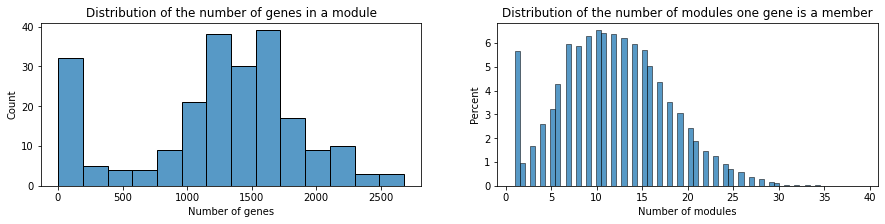

Number of genes in a module : 
- Mean : 1233.02 
- Median : 1330.5 
- Max : 2681 
- Min : 1 

Number of modules per gene : 
- Mean : 11.83 
- Median : 12.0 
- Max : 39 
- Min : 1 

0.00 % of genes are not included in any module.
5.68 % of genes are included in only one module.
94.32 % of genes are included in more than one module.
# cl 224


In [376]:
mm = mm_dict['FLAME_g2v']
mm_filt = mm.loc[np.sum(mm,axis=1)>0,np.sum(mm,axis=0)>0]
utilsClust.Overlap(mm_filt);
print("# cl", mm.shape[1])

In [377]:
sum(mm[0]==1)/mm.shape[0]

4.090481449666626e-05

Let's find the two larger clusters standing out from the cluster size distribution boxplot.

In [570]:
bigCl_sol = ['WGCNA_rna', 'SOM_g2v']
bigCl_ = []
for sol in bigCl_sol:
    imax = np.argmax(np.sum(mm_dict[sol], axis=0))
    n = np.sum(mm_dict[sol].loc[:,imax])
    bigCl = sol+'_'+str(imax)
    print(bigCl, "composed of", n, "genes")
    bigCl_.append(bigCl)

WGCNA_rna_129 composed of 3812 genes
SOM_g2v_210 composed of 3967 genes


# Summary

In [349]:
summary = misc.summary_all('./MembMatrix/')

In [352]:
datasets = {'rna':rna, 'g2v':g2v}

In [353]:
enr_summary = enrich.evalEnriched_all(datasets, enr_path='./MembMatrix/Enrich', score_th = None, pval=0.05)

In [354]:
enr_summary

,Alg,Dataset,Param,Prefix,File,rC,rG,Zc,Zg,Z-score
0,KMeans,rna,200,KMeans_rna_200,./MembMatrix/Enrich/KMeans_rna_200,0.545000,0.144642,0.328799,-0.383833,-0.038915
1,WGCNA,rna,ch0.01_2rcl_rcl0,WGCNA_rna_ch0.01_2rcl_rcl0,./MembMatrix/Enrich/WGCNA_rna_ch0.01_2rcl_rcl0,0.651282,0.175029,1.223348,-0.071945,0.814165
2,SOM,rna,square_letremy_letremy_standard,SOM_rna_square_letremy_letremy_standard,./MembMatrix/Enrich/SOM_rna_square_letremy_let...,0.524444,0.133095,0.155788,-0.502350,-0.245057
3,ICA,g2v,1e-6,ICA_g2v_1e-6,./MembMatrix/Enrich/ICA_g2v_1e-6,0.292929,0.154252,-1.792818,-0.285194,-1.469376
4,HC,rna,201,HC_rna_201,./MembMatrix/Enrich/HC_rna_201,0.585000,0.154568,0.665469,-0.281950,0.271189
5,GM,g2v,200_full,GM_g2v_200_full,./MembMatrix/Enrich/GM_g2v_200_full,0.413043,0.125128,-0.781846,-0.584121,-0.965885
6,HC,g2v,200,HC_g2v_200,./MembMatrix/Enrich/HC_g2v_200,0.369565,0.129914,-1.147792,-0.535000,-1.189914
7,GM,rna,200_full,GM_rna_200_full,./MembMatrix/Enrich/GM_rna_200_full,0.543147,0.149436,0.313204,-0.334624,-0.015146
8,PAM,rna,200,PAM_rna_200,./MembMatrix/Enrich/PAM_rna_200,0.522613,0.129718,0.140373,-0.537004,-0.280460
9,WGCNA,g2v,ch0.10_recl0,WGCNA_g2v_ch0.10_recl0,./MembMatrix/Enrich/WGCNA_g2v_ch0.10_recl0,0.445013,0.121528,-0.512769,-0.621068,-0.801743


In [384]:
ucl = []
for m in mm_dict:
    mod_=mm_dict[m]
    ModulesPerGene = np.sum(mod_, axis=1)
    ucl.append((m, sum(ModulesPerGene==0)/len(ModulesPerGene)))

In [385]:
pd.DataFrame(ucl)

,0,1
0,ICA_rna,0.059964
1,KMeans_g2v,0.000000
2,SOM_rna,0.000000
3,WGCNA_g2v,0.000000
4,HC_rna,0.000000
5,KMeans_rna,0.000000
6,GM_g2v,0.000000
7,PAM_rna,0.000000
8,SOM_g2v,0.000000
9,PAM_g2v,0.000000


# Plot clustering results

In [106]:
g2v = pd.read_csv('../data/gene2vec_dim_200_iter_9.csv', index_col=0)

In [107]:
rna = pd.read_csv('../data/RNAseqData.csv', index_col=0).transpose()

In [109]:
g2v_tSNE = pd.read_csv('../data/gene2vec_tSNE.csv', index_col=0)

In [110]:
rna_tSNE = pd.read_csv('../data/RNAseq_tSNE.csv',index_col=0)

In [112]:
PAM_g2v = pd.read_csv('./MembMatrix/PAM_g2v_200.csv', header=None, index_col=0)
PAM_g2v.columns = range(0,PAM_g2v.shape[1])

In [113]:
PAM_rna = pd.read_csv('./MembMatrix/PAM_rna_200.csv', header=None, index_col=0)
PAM_rna.columns = range(0,PAM_rna.shape[1])

In [114]:
KMeans_g2v = pd.read_csv('./MembMatrix/KMeans_g2v_200.csv', header=None, index_col=0)
KMeans_g2v.columns = range(0,PAM_g2v.shape[1])

In [115]:
KMeans_rna = pd.read_csv('./MembMatrix/KMeans_rna_200.csv', header=None, index_col=0)
KMeans_rna.columns = range(0,PAM_rna.shape[1])

In [118]:
ICA_g2v0 = pd.read_csv('./MembMatrix/ICA_g2v_1e-6.csv', index_col=0)
ICA_g2v0.columns = range(0,ICA_g2v0.shape[1])

In [119]:
ICA_rna0 = pd.read_csv('./MembMatrix/ICA_rna_1e-2.csv', index_col=0)
ICA_rna0.columns = range(0,ICA_rna0.shape[1])

In [120]:
WGCNA_g2v = pd.read_csv('./MembMatrix/WGCNA_g2v_ch0.10_recl0.csv', index_col=0)
WGCNA_g2v.columns = range(0,WGCNA_g2v.shape[1])

In [155]:
GM_g2v = misc.load_mm('./MembMatrix/GM_g2v_200_full.csv')

In [162]:
HC_rna = misc.load_mm('./MembMatrix/HC_rna_201.csv')

In [165]:
SOM_rna = misc.load_mm('./MembMatrix/SOM_rna_square_letremy_letremy_standard.csv')

In [9]:
reactome = pd.read_csv('../Matrices/Reactome.peDbId.matrix.csv', index_col=0)

In [10]:
reactome

,15869,68616,68689,68867,68875,68877,68881,68882,68884,68886,...,9754706,9755511,9755779,9758881,9758890,9759194,9759218,9762114,9763198,9767675
48888,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
49155,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
49189,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
49191,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
49291,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9766436,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9766524,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9766536,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9766647,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [123]:
WGCNA_rna = pd.read_csv('./MembMatrix/WGCNA_rna_ch0.01_2rcl_rcl0.csv', index_col=0)
WGCNA_rna.columns = range(0,WGCNA_rna.shape[1])

In [124]:
def isOverlap(mm):
    return np.any(np.sum(mm, axis=1)>1)

In [125]:
isOverlap(PAM_g2v)

False

In [126]:
isOverlap(PAM_rna)

False

In [127]:
from matplotlib.lines import Line2D
import random

In [128]:
reload(utilsClust)

<module 'utilsClust' from '/home/ldap/ipellet/Documents/Clustering/utilsClust.py'>

In [320]:
reload(misc)

<module 'clusterian.misc' from '/home/ldap/ipellet/Documents/Clustering/clusterian/misc.py'>

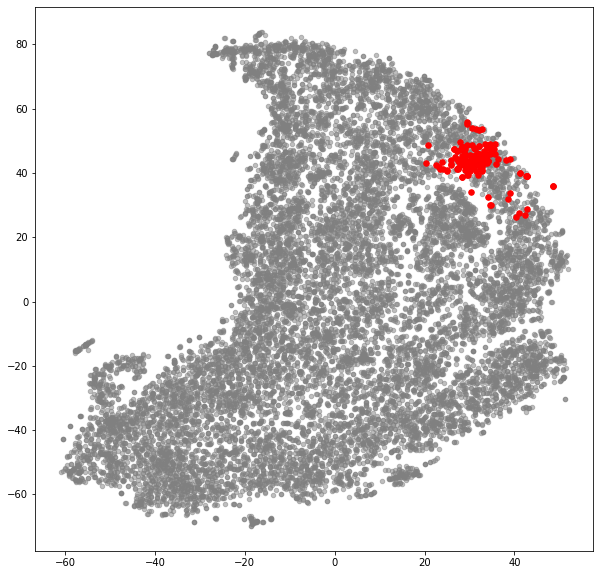

In [322]:
misc.plotCl(KMeans_rna, rna_tSNE, cl=92, title="", scl=30)

In [171]:
rankedGenes_file = '../GSEA_files/aug16/my_analysis.Gsea.1660654044499/ranked_gene_list_NR_versus_R_1660654044499.tsv'
rankedGenes = pd.read_csv(rankedGenes_file, sep='\t').loc[:,['NAME','SCORE']]

In [285]:
M = rankedGenes.loc[rankedGenes.index[0],'SCORE']
m = rankedGenes.loc[rankedGenes.index[-1],'SCORE']
score_norm = (rankedGenes.loc[:,'SCORE']-m)/(M-m)
score_norm.index=rankedGenes.loc[:,'NAME']
norm = plt.Normalize(vmin=rankedGenes.loc[rankedGenes.index[0],'SCORE'],
                    vmax=rankedGenes.loc[rankedGenes.index[-1],'SCORE'])

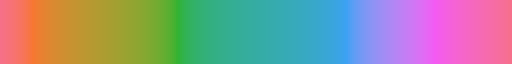

In [234]:
cmap = sns.color_palette("husl", as_cmap=True)
cmap

In [316]:
13/3

4.333333333333333

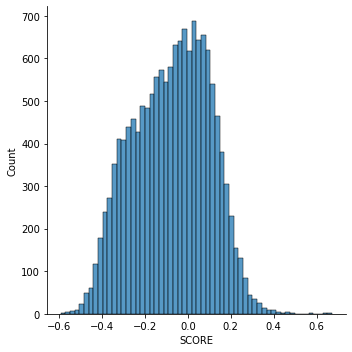

In [319]:
plt.rcParams['figure.figsize'] = 10,10
sns.displot(rankedGenes.loc[:,'SCORE']);
plt.savefig('../img/rankedGenes_hist.png', bbox_inches='tight')

In [311]:
cmap(score_norm)

array([[0.96760542, 0.43984146, 0.54795299, 1.        ],
       [0.96651286, 0.43158707, 0.61125197, 1.        ],
       [0.96317424, 0.40514198, 0.76564093, 1.        ],
       ...,
       [0.96918065, 0.45143466, 0.43537417, 1.        ],
       [0.96918065, 0.45143466, 0.43537417, 1.        ],
       [0.96779756, 0.44127456, 0.53581032, 1.        ]])

In [235]:
g_rna = rankedGenes.loc[:,'NAME']

In [257]:
from matplotlib import cm

In [324]:
plt.rcParams['figure.figsize'] = 13,10

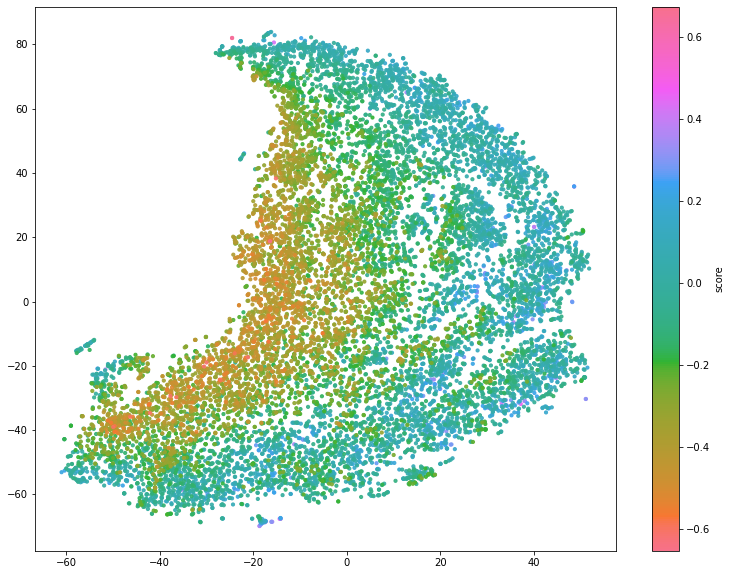

In [325]:
plt.scatter(x=rna_tSNE.loc[g_rna,'x'], y=rna_tSNE.loc[g_rna,'y'],
            c=cmap(score_norm), alpha=0.9, s=10, norm=plt.Normalize());
plt.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), label='score');
plt.savefig('../img/rankedGenes_rna_tSNE.png', bbox_inches='tight');

In [326]:
g_g2v = []
for g in g_rna:
    if g in g2v_tSNE.index:
        g_g2v.append(g)

In [330]:
plt.rcParams['figure.figsize'] = 10,10

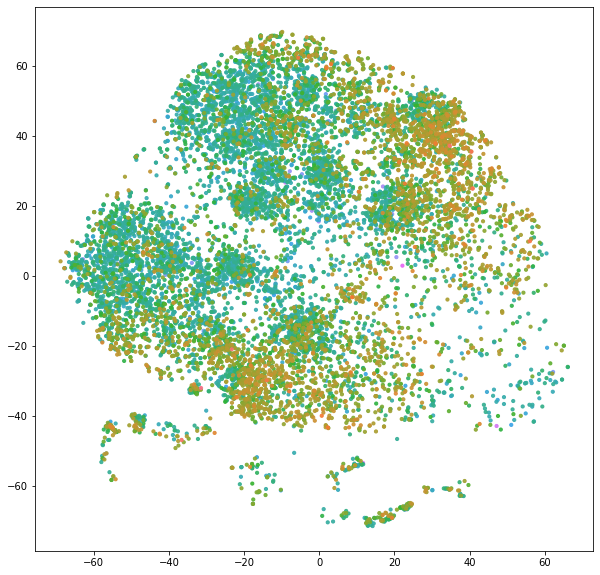

In [331]:
plt.scatter(x=g2v_tSNE.loc[g_g2v,'x'], y=g2v_tSNE.loc[g_g2v,'y'], 
            c=cmap(score_norm[g_g2v]), alpha=0.9, s=10);
#plt.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), label='score');
plt.savefig('../img/rankedGenes_g2v_tSNE.png', bbox_inches='tight');

In [337]:
w = 3/13
B = 1/(w+2)
A = B*w

In [338]:
w

0.23076923076923078

In [341]:
w1 = 546
w2 = 262
h1 = 719
h2 = 395
x = h2/h1
p1 = w1*x/(w1*x+w2)
p2 = w2/(w1*x+w2)

(p1,p2)

(0.5337732150635568, 0.4662267849364432)

In [339]:
P1 = A+B
P2 = B
P1+P2 == 1

True

In [340]:
print(P1, P2)

0.5517241379310345 0.4482758620689655


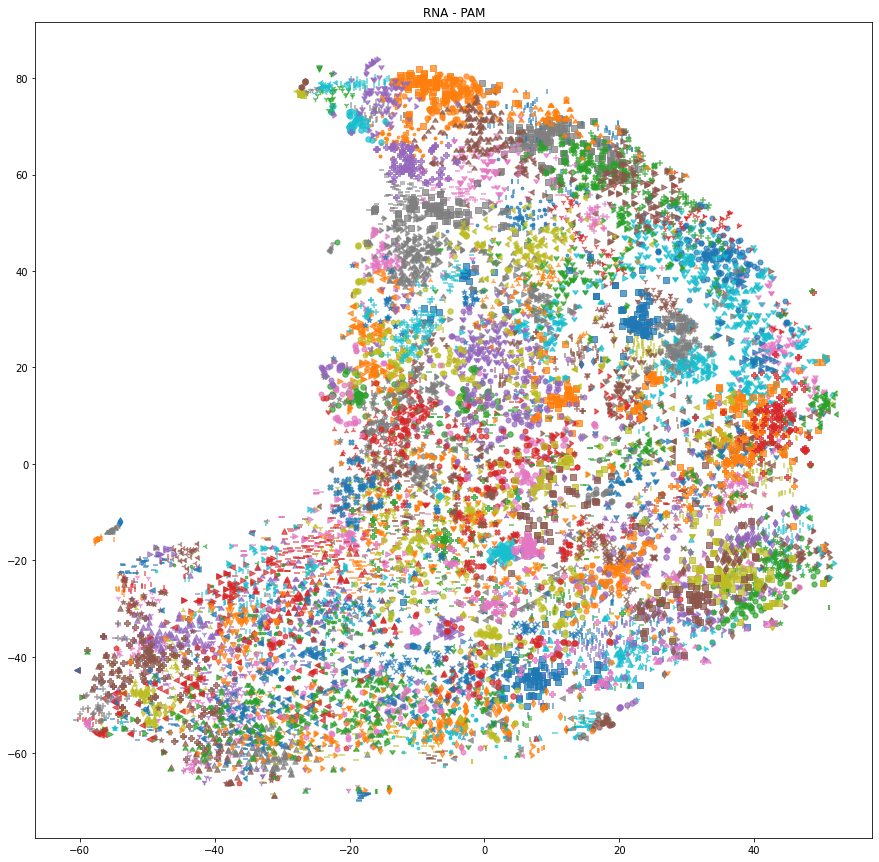

In [178]:
misc.plotClust(PAM_rna, rna_tSNE, title="RNA - PAM")

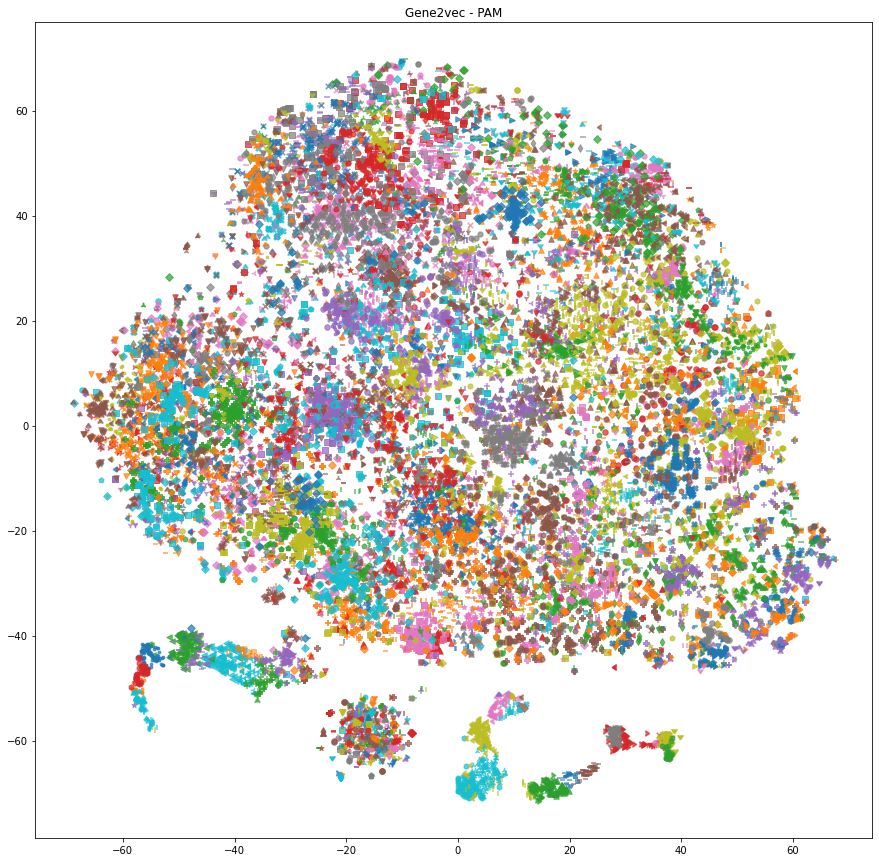

In [19]:
utilsClust.plotClust(PAM_g2v, g2v_tSNE, title="Gene2vec - PAM")

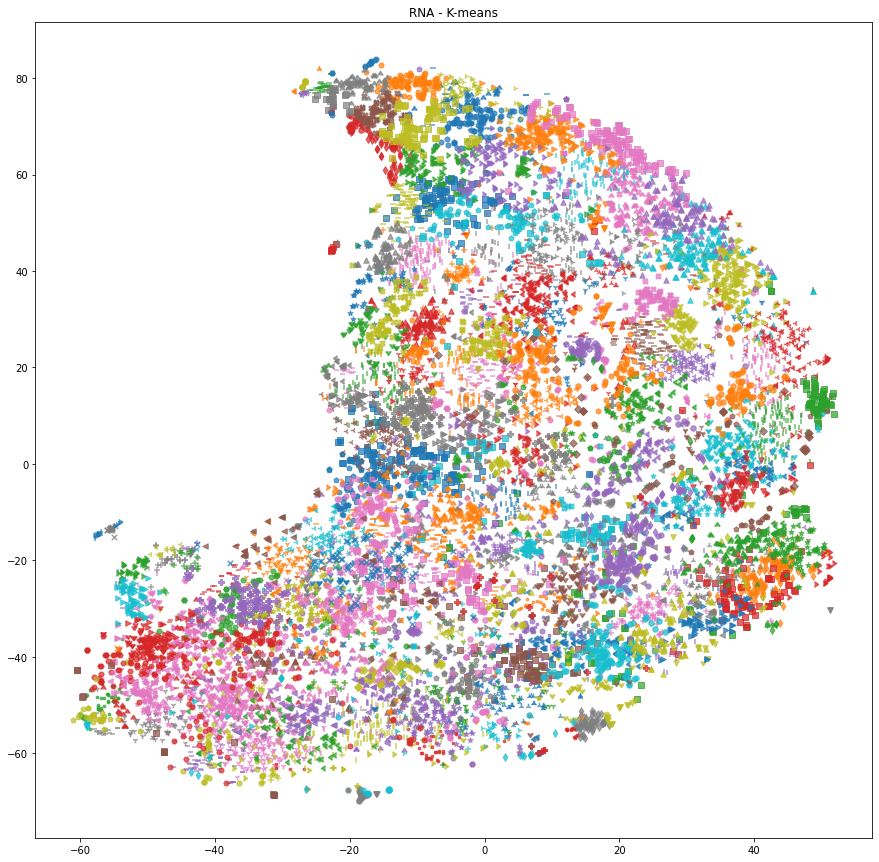

In [50]:
utilsClust.plotClust(KMeans_rna, rna_tSNE, title="RNA - K-means")

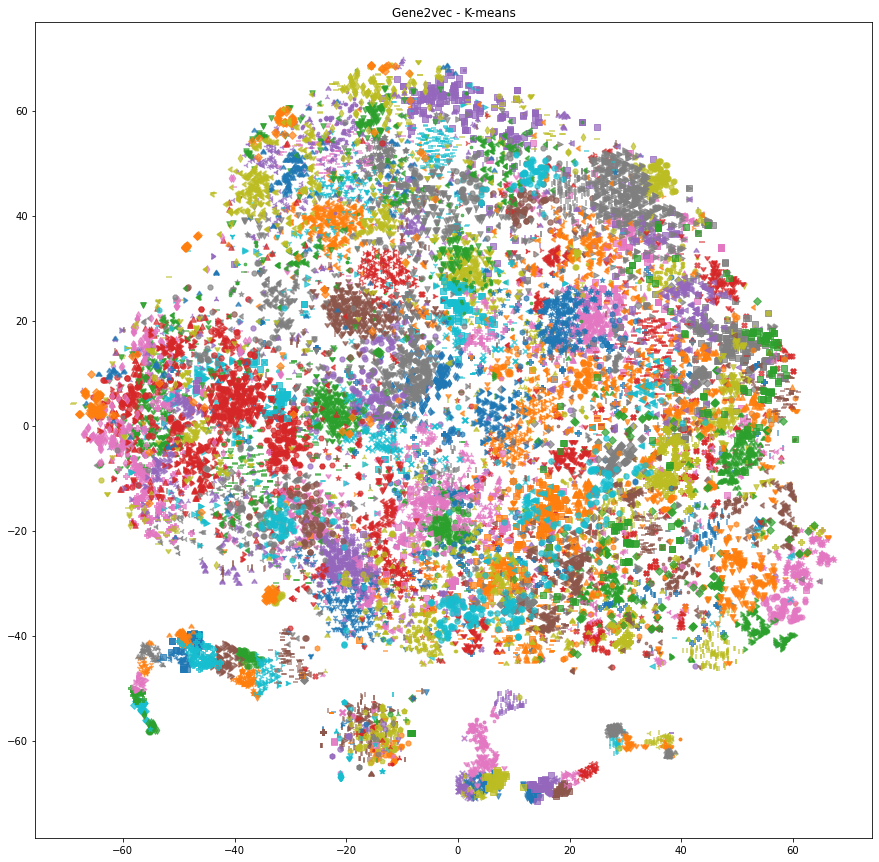

In [51]:
utilsClust.plotClust(KMeans_g2v, g2v_tSNE, title="Gene2vec - K-means")

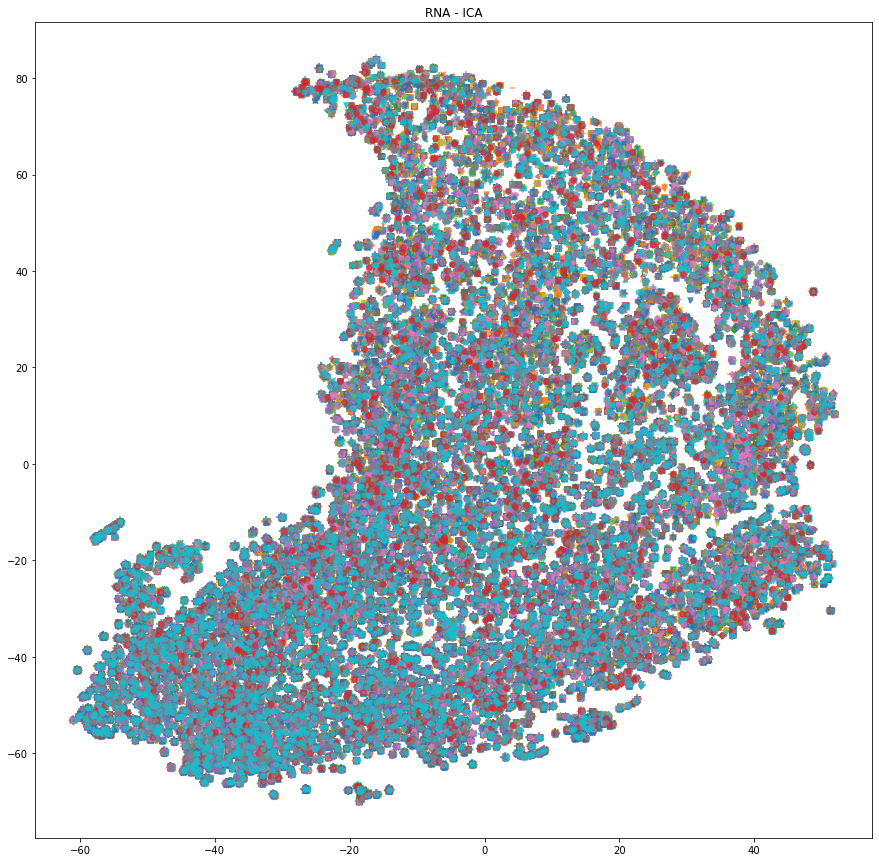

In [43]:
utilsClust.plotClust(ICA_rna0, rna_tSNE, title="RNA - ICA")

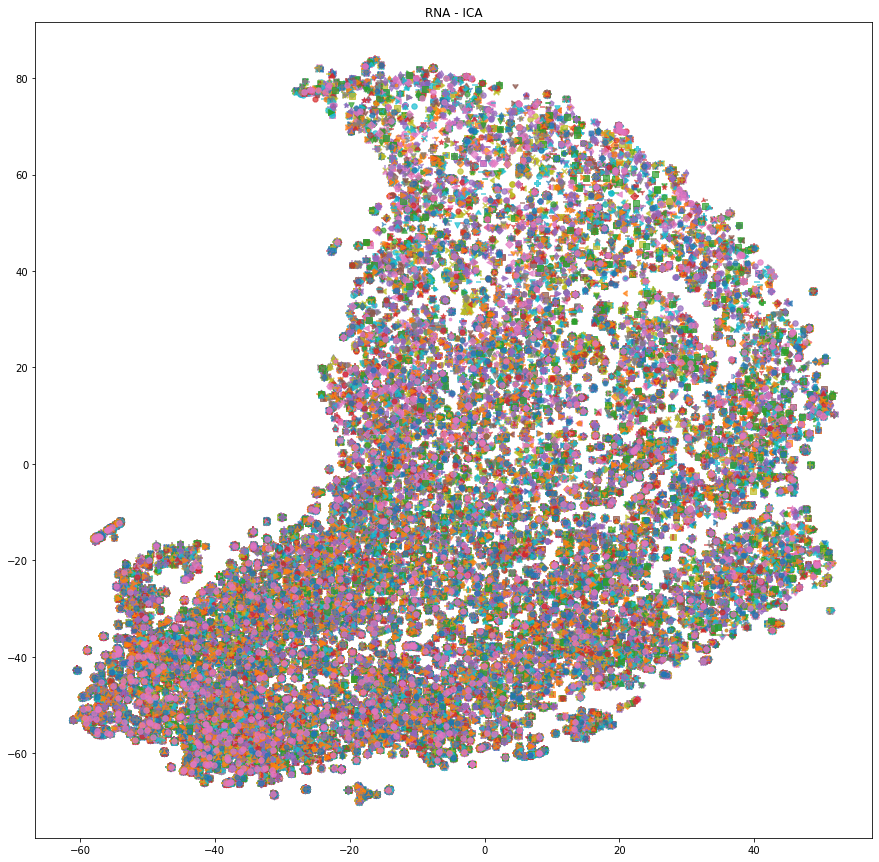

In [44]:
utilsClust.plotClust(ICA_rna, rna_tSNE, title="RNA - ICA")

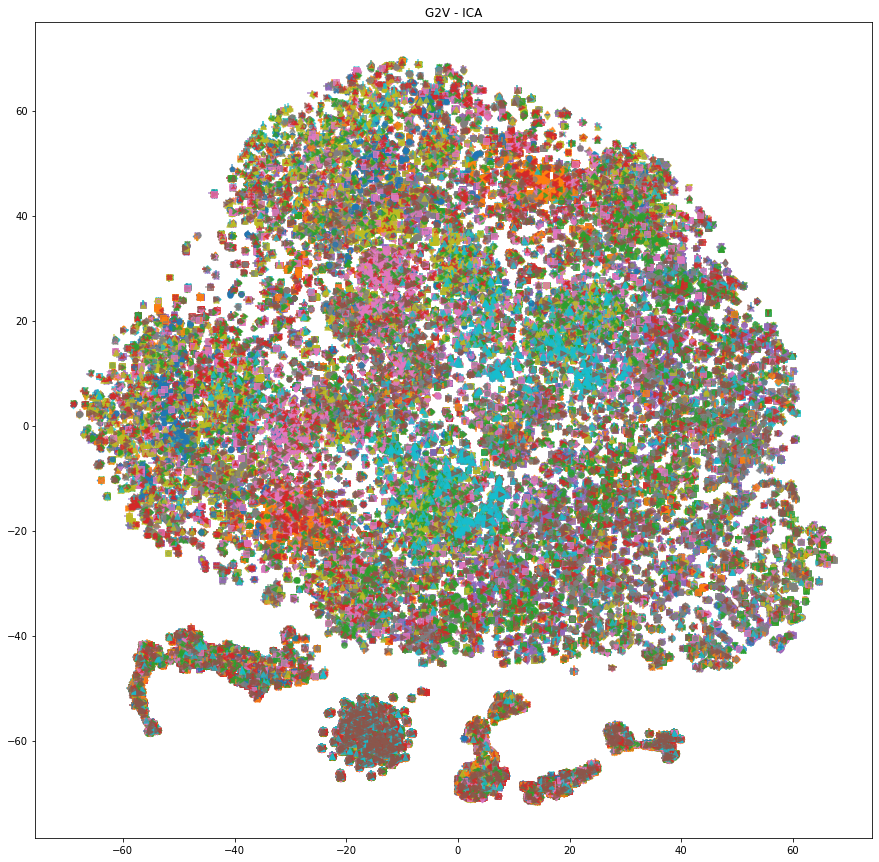

In [46]:
utilsClust.plotClust(ICA_g2v0, g2v_tSNE, title="G2V - ICA")

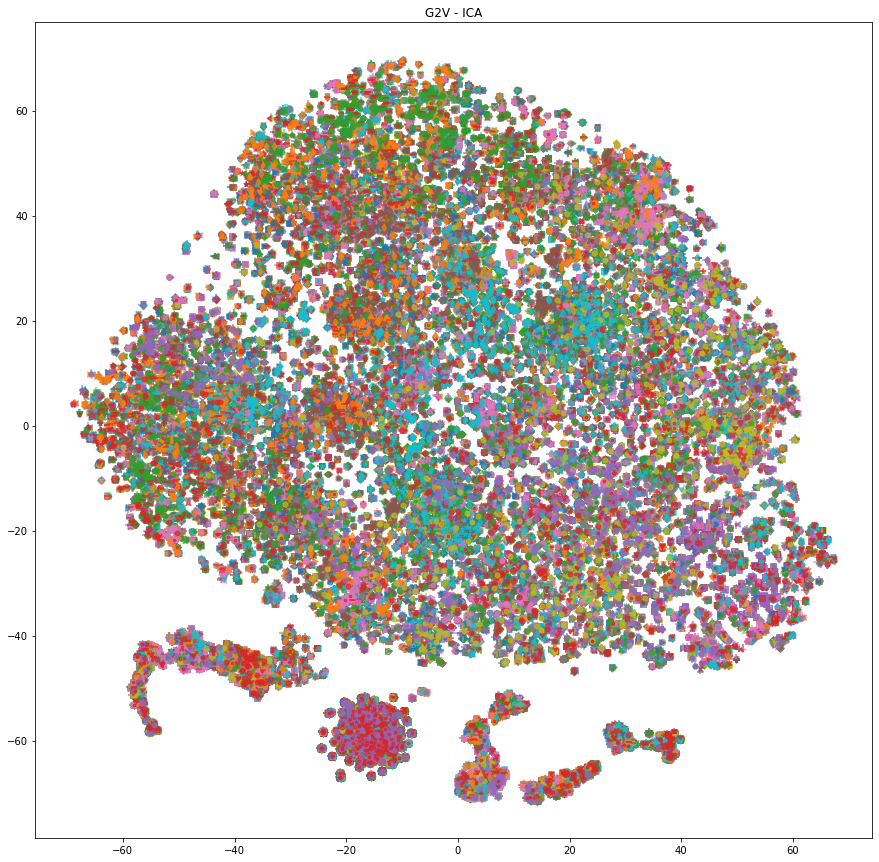

In [47]:
utilsClust.plotClust(ICA_g2v, g2v_tSNE, title="G2V - ICA")

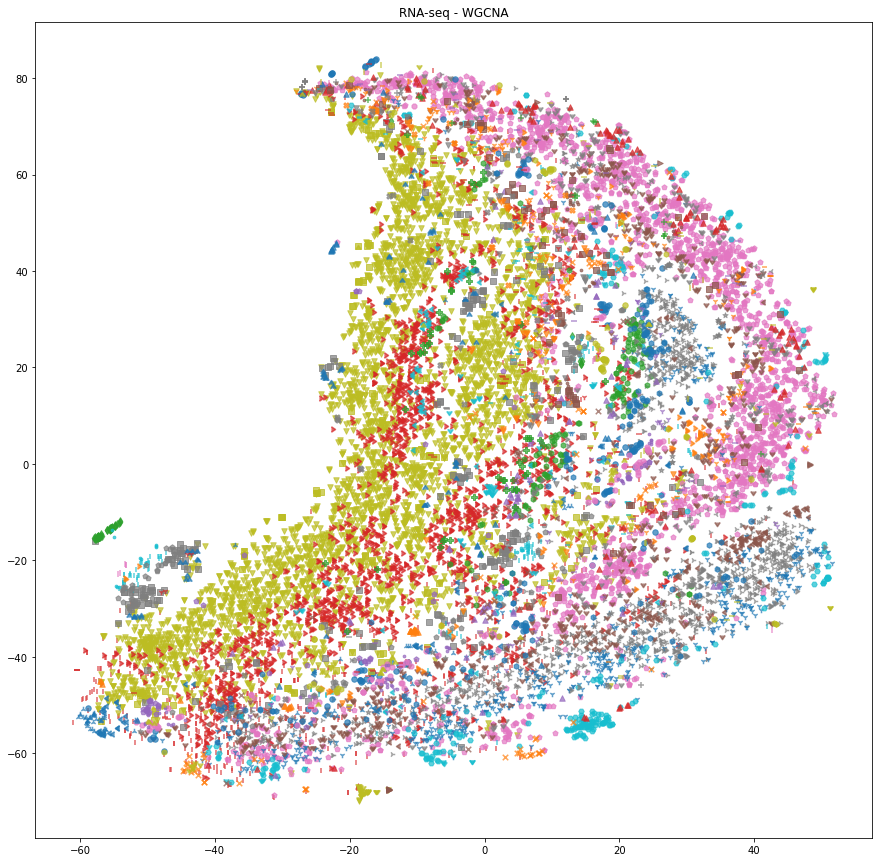

In [55]:
utilsClust.plotClust(WGCNA_rna, rna_tSNE, title="RNA-seq - WGCNA")

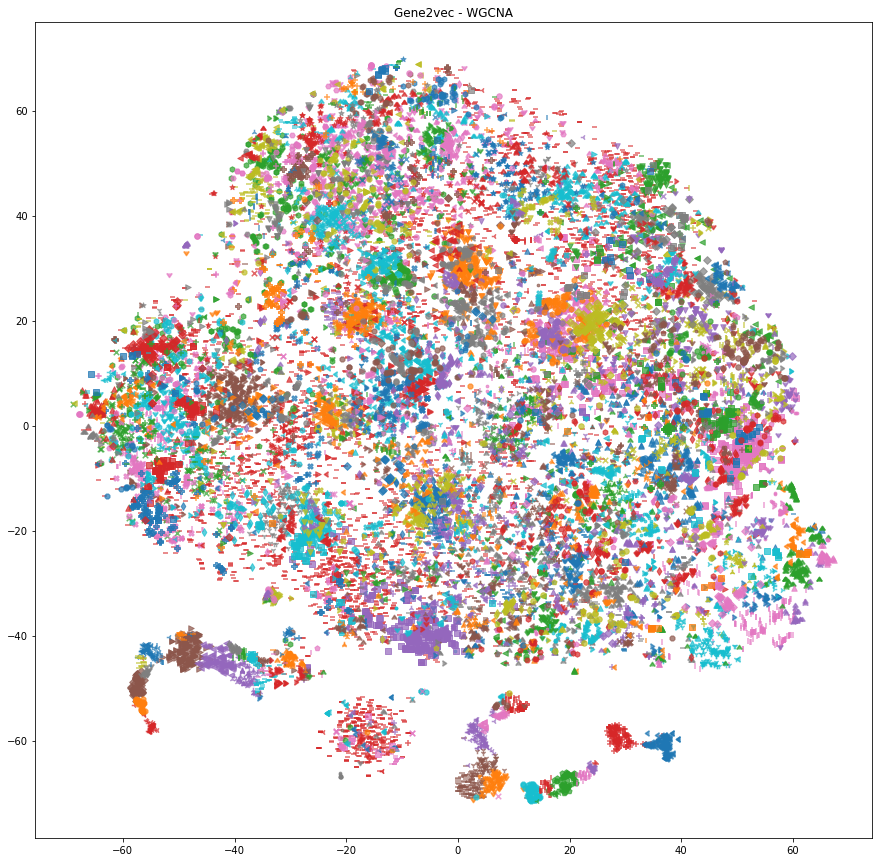

In [56]:
utilsClust.plotClust(WGCNA_g2v, g2v_tSNE, title="Gene2vec - WGCNA")

# Enrichment analysis

In [170]:
g2v = pd.read_csv('../data/gene2vec_dim_200_iter_9.csv', index_col=0)
rna = pd.read_csv('../data/RNAseqData.csv', index_col=0).transpose()

Let's find out the composition of the two large clusters in `bigCl_`

In [575]:
reload(enrich)

<module 'clusterian.enrich' from '/home/ldap/ipellet/Documents/Clustering/clusterian/enrich.py'>

In [642]:
WGCNA_rna_192_enr, enrGenes, allGenes = enrich.getEnrich_cl('./MembMatrix/Enrich/WGCNA_rna_ch0.01_2rcl_rcl0', 129, pval=0.05, score_th=None, mm=mm_dict['WGCNA_rna'])
WGCNA_rna_192_enr = WGCNA_rna_192_enr.sort_values('Overlap Num', ascending=False)
print(len(enrGenes)/len(allGenes))
WGCNA_rna_192_enr

0.07869884575026233


,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,Overlap Num
2,GO_Biological_Process_2021,release of cytochrome c from mitochondria (GO:...,12/18,1.327257e-05,0.018154,0,0,8.516842,95.642528,FIS1;BAD;BCL2;BAX;SFN;BAK1;BID;CLU;BBC3;TIMM50...,0.666667
10,GO_Biological_Process_2021,regulation of mitochondrial outer membrane per...,11/18,9.991267e-05,0.044666,0,0,6.689631,61.619619,SLC35F6;TMEM102;HIP1R;CHCHD10;MUL1;BAX;ZNF205;...,0.611111
8,GO_Biological_Process_2021,intrinsic apoptotic signaling pathway in respo...,15/29,7.882612e-05,0.043436,0,0,4.563941,43.121334,PPP1R15A;BRSK2;CEBPB;ATP2A3;DAB2IP;ATP2A1;TRAF...,0.517241
5,GO_Biological_Process_2021,apoptotic mitochondrial changes (GO:0008637),17/33,2.824303e-05,0.025221,0,0,4.527734,47.426490,FIS1;BAD;BIK;NAIF1;ATP2A1;CLU;CCAR2;BBC3;TIMM5...,0.515152
4,GO_Biological_Process_2021,semaphorin-plexin signaling pathway (GO:0071526),18/35,1.694115e-05,0.018154,0,0,4.512977,49.578506,SEMA6B;SEMA5B;SEMA4A;SEMA6C;NRP2;SEMA6A;SEMA4B...,0.514286
7,GO_Biological_Process_2021,positive regulation of mitochondrion organizat...,24/58,7.231466e-05,0.043436,0,0,3.010249,28.701171,PRKN;FIS1;RALA;BAD;BIK;HIP1R;MUL1;HTRA2;HTT;CH...,0.413793
11,GO_Biological_Process_2021,positive regulation of apoptotic signaling pat...,24/59,1.000348e-04,0.044666,0,0,2.924061,26.930580,FIS1;WWOX;TNFRSF12A;CRADD;BAD;TNFSF12;DAB2IP;T...,0.406780
9,GO_Biological_Process_2021,intrinsic apoptotic signaling pathway (GO:0097...,36/102,8.106840e-05,0.043436,0,0,2.328871,21.938474,PPP1R15A;BRSK2;CDKN1A;CEBPB;PPP1R13B;ATP2A3;HT...,0.352941
3,GO_Biological_Process_2021,axon guidance (GO:0007411),64/203,1.375769e-05,0.018154,0,0,1.971576,22.069652,EPHB6;ROBO3;SEMA5B;NRP2;ARHGAP35;TUBB3;BSG;KIF...,0.315271
1,GO_Biological_Process_2021,positive regulation of programmed cell death (...,88/286,1.189948e-06,0.003188,0,0,1.908342,26.032845,RARG;PRR7;TRIO;UBE2Z;CLU;CCAR2;PYCARD;CASP9;PR...,0.307692


In [645]:
pd.set_option('display.max_colwidth', None)
term_ = WGCNA_rna_192_enr.loc[:,['Term']]
term_

,Term
2,release of cytochrome c from mitochondria (GO:0001836)
10,regulation of mitochondrial outer membrane permeabilization involved in apoptotic signaling pathway (GO:1901028)
8,intrinsic apoptotic signaling pathway in response to endoplasmic reticulum stress (GO:0070059)
5,apoptotic mitochondrial changes (GO:0008637)
4,semaphorin-plexin signaling pathway (GO:0071526)
7,positive regulation of mitochondrion organization (GO:0010822)
11,positive regulation of apoptotic signaling pathway (GO:2001235)
9,intrinsic apoptotic signaling pathway (GO:0097193)
3,axon guidance (GO:0007411)
1,positive regulation of programmed cell death (GO:0043068)


In [626]:
pd.set_option('display.max_colwidth', 50)

Most of the enriched terms are related to the apoptotic process.

In [627]:
reload(enrich)

<module 'clusterian.enrich' from '/home/ldap/ipellet/Documents/Clustering/clusterian/enrich.py'>

In [628]:
enrich.getOntology(term_)

'https://www.ebi.ac.uk/QuickGO/services/ontology/go/terms/{ids}/chart?ids=GO%3A0001836%2CGO%3A1901028%2CGO%3A0070059%2CGO%3A0008637%2CGO%3A0071526%2CGO%3A0010822%2CGO%3A2001235%2CGO%3A0097193%2CGO%3A0007411%2CGO%3A0043068%2CGO%3A0043065%2CGO%3A0016310'

In [641]:
SOM_g2v_210_enr, enrGenes, allGenes  = enrich.getEnrich_cl('./MembMatrix/Enrich/SOM_g2v_square_gaussian_canberra_standard', 210, pval=0.05, score_th=None, mm=mm_dict['SOM_g2v'])
SOM_g2v_210_enr = SOM_g2v_210_enr.sort_values('Overlap Num', ascending=False)
print(len(enrGenes)/len(allGenes))
SOM_g2v_210_enr

0.616334761784724


,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,Overlap Num
210,GO_Biological_Process_2021,deoxyribonucleotide metabolic process (GO:0009...,5/5,3.063864e-04,0.007369,0,0,80165.000000,648588.046371,RRM1;RRM2;RRM2B;SAMHD1;DERA,1.000000
221,GO_Biological_Process_2021,rRNA-containing ribonucleoprotein complex expo...,6/7,3.528084e-04,0.008065,0,0,24.284777,193.053904,LSG1;NPM1;XPO1;TSC1;ABCE1;RAN,0.857143
220,GO_Biological_Process_2021,protein desumoylation (GO:0016926),6/7,3.528084e-04,0.008065,0,0,24.284777,193.053904,SENP6;SENP7;USPL1;SENP2;SENP3;SENP1,0.857143
312,GO_Biological_Process_2021,acetyl-CoA biosynthetic process from pyruvate ...,5/6,1.534782e-03,0.024494,0,0,20.232206,131.091887,PDHX;PDHA1;DLAT;PDHB;DLD,0.833333
313,GO_Biological_Process_2021,metaphase/anaphase transition of cell cycle (G...,5/6,1.534782e-03,0.024494,0,0,20.232206,131.091887,CDC23;ANAPC7;CDC16;CDC27;TACC3,0.833333
...,...,...,...,...,...,...,...,...,...,...,...
370,GO_Biological_Process_2021,regulation of apoptotic process (GO:0042981),178/742,2.644199e-03,0.036171,0,0,1.288483,7.647642,ANKRD13C;ARL6IP1;ZFAND6;PARK7;TNF;IKZF3;IFIT3;...,0.239892
76,GO_Biological_Process_2021,"regulation of transcription, DNA-templated (GO...",537/2244,2.393483e-07,0.000016,0,0,1.313928,20.031288,ATF1;RB1;ATF2;ZNF175;NUP107;SPI1;TRRAP;ZNF292;...,0.239305
278,GO_Biological_Process_2021,"negative regulation of transcription, DNA-temp...",226/948,1.085363e-03,0.019743,0,0,1.281112,8.744667,RB1;TCERG1;ZNF175;SPI1;GFI1;EHMT1;HNRNPU;RBPJ;...,0.238397
396,GO_Biological_Process_2021,regulation of gene expression (GO:0010468),249/1079,3.846267e-03,0.049168,0,0,1.226708,6.821296,RB1;ATF2;NUP107;SPI1;TRRAP;JMJD1C;RBPJ;RPL6;CC...,0.230769


In [354]:
enr_path='./MembMatrix/Enrich'
pval=0.05
score_th=None
all_enr = enrich.getAll_enr_def(enr_path)
nTermCl_ = []
for i in all_enr.index:
    data = datasets[all_enr.at[i,'Dataset']]
    sol = '_'.join(all_enr.loc[i,['Alg','Dataset']])
    _, nTermCl, _, _ = enrich.getEnriched(all_enr.at[i,'File'],score_th,genes=data.index, 
                                          pval=pval)
    nTermCl_.append(pd.Series(nTermCl.loc[:,'n_enrich'], index=nTermCl.loc[:,'Cluster'], 
                              name=sol, dtype=int))

In [355]:
sol_ = []
for i in all_enr.index:
    sol = '_'.join(all_enr.loc[i,['Alg','Dataset']])
    sol_.append(sol)
        

In [171]:
PAM_g2v = pd.read_csv('./MembMatrix/PAM_g2v_200.csv', header=None, index_col=0)
PAM_g2v.columns = range(0,PAM_g2v.shape[1])

In [42]:
PAM_rna = pd.read_csv('./MembMatrix/PAM_rna_200.csv', header=None, index_col=0)
PAM_rna.columns = range(0,PAM_rna.shape[1])

In [2]:
mm_path = './MembMatrix'
mm_file_names = []
for (dirpath, dirnames, filenames) in os.walk(mm_path):
    mm_file_names.extend(filenames)
    break

In [54]:
enr_path = os.path.join(mm_path,'Enrich')
enr_dir_content = []
for (dirpath, dirnames, filenames) in os.walk(enr_path):
    enr_dir_content.extend(dirnames)
    break
    
for filename in mm_file_names:
    path = os.path.join(mm_path,filename)
    #attr = filename.split('_')
    #algo = attr[0]
    #dataset = attr[1]
    #if len(attr)>2:
    #    parm = '_'.join(attr[2:])[:-4]
    
    desc = filename[:-4]
    
    if desc not in enr_dir_content:
        print('Runing analysis on ', desc) 
        
        mm = pd.read_csv(path, header=None, index_col=0)
        if type(mm.index[0])!=str or len(mm.index[0])<2:
            mm = pd.read_csv(path, header=0, index_col=0)
        mm.columns = range(0,mm.shape[1])
        
        print('out_dir :', enr_path)
        where_ = enrich.runEnrichr(mm, desc, gene_sets='GO_Biological_Process_2021', out_dir= enr_path)
        print('Enrichment results in :', where_)

Runing analysis on  KMeans_rna_200
out_dir : ./ModuleMatrix/Enrich
Cluster 88 : ['TRAF3IP3', 'CD4', 'ADAM28', 'LCP2', 'PRDM1', 'ANKRD44', 'CD84', 'CLEC2D', 'PAG1', 'FYB1', 'SMAP2', 'LYZ', 'SEL1L3', 'ADA2', 'APOL1', 'NFATC2', 'RASSF2', 'MS4A6A', 'BTN3A3', 'ITGA4', 'NCKAP1L', 'SEPTIN6', 'FGL2', 'APOL3', 'JCHAIN', 'EPSTI1', 'SP110', 'IRF8', 'CD53', 'SH3KBP1', 'PARP8', 'GBP5', 'ELMO1', 'SLA', 'GBP2', 'GBP4', 'CTSS', 'SYK', 'IL7R', 'INPP5D', 'CHST11', 'KLHL6', 'HLADQB1', 'HCLS1', 'SLC8A1', 'TENT5C', 'IKZF1', 'DPYD', 'HLADQA1', 'IRF1AS1', 'MPEG1', 'PLCG2', 'RCSD1', 'HCP5', 'HLADMB']
Enrichment results in : ./ModuleMatrix/Enrich/KMeans_rna_200
Runing analysis on  PAM_rna_200
out_dir : ./ModuleMatrix/Enrich
Enrichment results in : ./ModuleMatrix/Enrich/PAM_rna_200
Runing analysis on  PAM_g2v_200
out_dir : ./ModuleMatrix/Enrich
Enrichment results in : ./ModuleMatrix/Enrich/PAM_g2v_200
Runing analysis on  WGCNA_rna_ch0.05
out_dir : ./ModuleMatrix/Enrich
Enrichment results in : ./ModuleMatrix/Enr

In [174]:
reload(enrich)

<module 'clusterian.enrich' from '/home/ldap/ipellet/Documents/Clustering/clusterian/enrich.py'>

In [175]:
enrich.runEnrichr_directory(mm_path = './MembMatrix', mm_enrich_dir = 'Enrich')

Runing analysis on  GM_g2v_200_full
out_dir : ./MembMatrix/Enrich
Enrichment results in : ./MembMatrix/Enrich/GM_g2v_200_full
Runing analysis on  GM_rna_200_full
out_dir : ./MembMatrix/Enrich
Enrichment results in : ./MembMatrix/Enrich/GM_rna_200_full
Runing analysis on  WGCNA_rna_ch0.01_2rcl_rcl0
out_dir : ./MembMatrix/Enrich
Enrichment results in : ./MembMatrix/Enrich/WGCNA_rna_ch0.01_2rcl_rcl0


In [64]:
enriched, n_term_cl, enr_cl_part, genes_in_enr_part0 = enrich.getEnriched('./MembMatrix/Enrich/KMeans_rna_200', score_th = 300, genes=rna.index)

In [ ]:
enriched, n_term_cl, enr_cl_part, genes_in_enr_part1 = enrich.getEnriched('./MembMatrix/Enrich/KMeans_rna_200', score_th = 300)

In [69]:
enriched

,Cluster,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
19,0,GO_Biological_Process_2021,drug transport (GO:0015893),1/5,0.011448,0.150826,0,0,110.833333,495.415956,ABCC2
33,0,GO_Biological_Process_2021,positive regulation of epithelial tube formati...,1/7,0.015992,0.150826,0,0,73.881481,305.551108,EGF
32,0,GO_Biological_Process_2021,leukotriene transport (GO:0071716),1/7,0.015992,0.150826,0,0,73.881481,305.551108,ABCC2
34,0,GO_Biological_Process_2021,positive regulation of type I interferon-media...,1/7,0.015992,0.150826,0,0,73.881481,305.551108,TRIM6
28,0,GO_Biological_Process_2021,xenobiotic transport across blood-brain barrie...,1/6,0.013722,0.150826,0,0,88.662222,380.247469,ABCC2
...,...,...,...,...,...,...,...,...,...,...,...
24,198,GO_Biological_Process_2021,cellular response to prostaglandin E stimulus ...,1/7,0.004890,0.041515,0,0,256.153846,1362.862370,SFRP1
7,198,GO_Biological_Process_2021,cellular response to vitamin (GO:0071295),1/5,0.003495,0.041515,0,0,384.269231,2173.545039,SFRP1
9,198,GO_Biological_Process_2021,camera-type eye photoreceptor cell differentia...,1/5,0.003495,0.041515,0,0,384.269231,2173.545039,PROM1
53,198,GO_Biological_Process_2021,thymus development (GO:0048538),1/14,0.009759,0.044692,0,0,118.183432,547.142878,EPHB3


In [66]:
enr_cl_part

0.7939698492462312

In [67]:
genes_in_enr_part0

0.099601593625498

In [68]:
genes_in_enr_part1

array(['ABCA1', 'ABCA12', 'ABCA13', ..., 'ZW10', 'ZWILCH', 'ZWINT'],
      dtype='<U10')

In [124]:
reload(misc)

<module 'clusterian.misc' from '/home/ldap/ipellet/Documents/Clustering/clusterian/misc.py'>

In [249]:
reload(enrich)

<module 'clusterian.enrich' from '/home/ldap/ipellet/Documents/Clustering/clusterian/enrich.py'>

In [250]:
all_enr_def =  enrich.getAll_enr_def(enr_path = './MembMatrix/Enrich')

In [251]:
all_enr_def

,Alg,Dataset,Param,Prefix,File
0,KMeans,rna,200,KMeans_rna_200,./MembMatrix/Enrich/KMeans_rna_200
1,WGCNA,rna,ch0.01_2rcl_rcl0,WGCNA_rna_ch0.01_2rcl_rcl0,./MembMatrix/Enrich/WGCNA_rna_ch0.01_2rcl_rcl0
2,SOM,rna,HexLet,SOM_rna_HexLet,./MembMatrix/Enrich/SOM_rna_HexLet
3,ICA,g2v,10_1e-4,ICA_g2v_10_1e-4,./MembMatrix/Enrich/ICA_g2v_10_1e-4
4,ICA,rna,3_1e-1,ICA_rna_3_1e-1,./MembMatrix/Enrich/ICA_rna_3_1e-1
5,ICA,g2v,1e-6,ICA_g2v_1e-6,./MembMatrix/Enrich/ICA_g2v_1e-6
6,GM,g2v,200_full,GM_g2v_200_full,./MembMatrix/Enrich/GM_g2v_200_full
7,WGCNA,g2v,ch0.10,WGCNA_g2v_ch0.10,./MembMatrix/Enrich/WGCNA_g2v_ch0.10
8,SOM,g2v,HexGauss,SOM_g2v_HexGauss,./MembMatrix/Enrich/SOM_g2v_HexGauss
9,GM,rna,200_full,GM_rna_200_full,./MembMatrix/Enrich/GM_rna_200_full


In [284]:
reload(enrich)

<module 'clusterian.enrich' from '/home/ldap/ipellet/Documents/Clustering/clusterian/enrich.py'>

In [253]:
datasets = {'rna':rna, 'g2v':g2v}

In [116]:
evEnr = enrich.evalEnriched_all(datasets, enr_path='./MembMatrix/Enrich', pval=0.05)

In [117]:
evEnr

,Alg,Dataset,Param,Prefix,File,rC,rG,Zc,Zg,Z-score
0,KMeans,rna,200,KMeans_rna_200,./MembMatrix/Enrich/KMeans_rna_200,0.545000,0.144642,0.411500,-0.524269,-0.079740
1,WGCNA,rna,ch0.01_2rcl_rcl0,WGCNA_rna_ch0.01_2rcl_rcl0,./MembMatrix/Enrich/WGCNA_rna_ch0.01_2rcl_rcl0,0.651282,0.175029,1.275079,-0.238276,0.733130
2,ICA,g2v,10_1e-4,ICA_g2v_10_1e-4,./MembMatrix/Enrich/ICA_g2v_10_1e-4,0.260870,0.119851,-1.897158,-0.757592,-1.877192
3,SOM,rna,square_letremy_letremy_standard,SOM_rna_square_letremy_letremy_standard,./MembMatrix/Enrich/SOM_rna_square_letremy_let...,0.524444,0.133095,0.244479,-0.632947,-0.274688
4,ICA,rna,3_1e-1,ICA_rna_3_1e-1,./MembMatrix/Enrich/ICA_rna_3_1e-1,0.570000,0.302991,0.614634,0.966073,1.117729
5,ICA,g2v,1e-6,ICA_g2v_1e-6,./MembMatrix/Enrich/ICA_g2v_1e-6,0.292929,0.154252,-1.636662,-0.433820,-1.464052
6,HC,rna,201,HC_rna_201,./MembMatrix/Enrich/HC_rna_201,0.585000,0.154568,0.736514,-0.430845,0.216141
7,GM,g2v,200_full,GM_g2v_200_full,./MembMatrix/Enrich/GM_g2v_200_full,0.413043,0.125128,-0.660692,-0.707929,-0.967762
8,FLAME,g2v,6nn_1e-15_recl,FLAME_g2v_6nn_1e-15_recl,./MembMatrix/Enrich/FLAME_g2v_6nn_1e-15_recl,0.551724,0.371088,0.466136,1.606984,1.465917
9,HC,g2v,200,HC_g2v_200,./MembMatrix/Enrich/HC_g2v_200,0.369565,0.129914,-1.013968,-0.662886,-1.185715


# Find best k

In [2]:
from sklearn import datasets
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.metrics import pairwise_distances
import numpy as np

In [24]:
k_test = [i for i in range(50,500)]
kmeans_res = []
for k in k_test:
    kmeans = KMeans(n_clusters=k).fit(rna)
    kmeans_res.append(kmeans.labels_  )

In [25]:
ch_res = []
for labels in kmeans_res:
    ch_res.append(metrics.calinski_harabasz_score(rna, labels))

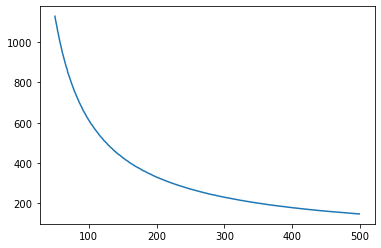

In [26]:
plt.plot(k_test,ch_res)

In [27]:
db_res = []
for labels in kmeans_res:
    db_res.append(metrics.davies_bouldin_score(rna, labels))

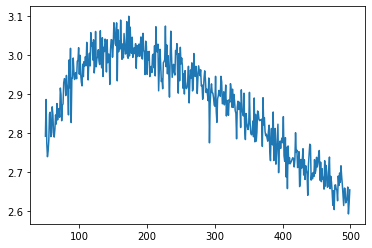

In [28]:
plt.plot(k_test,db_res)

In [29]:
sil_res = []
for labels in kmeans_res:
    sil_res.append(metrics.silhouette_score(rna, labels))

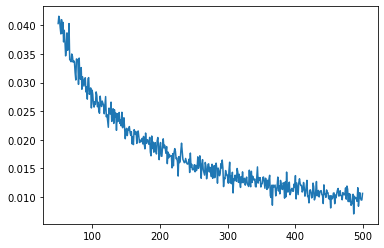

In [30]:
plt.plot(k_test,sil_res)

In [290]:
import pickle

In [32]:
file = open("KMeans_rna_50-500.txt", "wb") 
pickle.dump(kmeans_res, file)
file.close()

All results are loaded, converted to membership matrix and saved into a separate directory.

In [291]:
with open("KMeans_rna_50-500.txt", "rb") as input_file:
    kmeans_res = pickle.load(input_file)

In [5]:
directory = './KMeans_mm'

In [293]:
for lab in kmeans_res:
    mm = misc.lab2mat(lab, genes=rna.index)
    k = mm.shape[1]
    mm.to_csv(os.path.join(directory,'KMeans_rna_'+str(k)), header=False, index=True)

Enrichment analysis is ran on all membership matrix created.

In [7]:
reload(enrich)

<module 'clusterian.enrich' from '/home/ldap/ipellet/Documents/Clustering/clusterian/enrich.py'>

In [8]:
enrdir = 'Enrich'
enrich.runEnrichr_directory(mm_path = directory, mm_enrich_dir = enrdir)

Runing analysis on  KMeans_rna_86
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_86
Runing analysis on  KMeans_rna_384
out_dir : ./KMeans_mm/Enrich
Cluster 334
Cluster 335
Cluster 351
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_384
Runing analysis on  KMeans_rna_456
out_dir : ./KMeans_mm/Enrich
Cluster 123
Cluster 156
Cluster 191
Cluster 259
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_456
Runing analysis on  KMeans_rna_180
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_180
Runing analysis on  KMeans_rna_287
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_287
Runing analysis on  KMeans_rna_92
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_92
Runing analysis on  KMeans_rna_333
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_333
Runing analysis on  KMeans_rna_58
out_dir : ./KMeans_mm/Enrich
Enr

2022-07-11 19:46:28,236 Error fetching enrichment results: GO_Biological_Process_2021
2022-07-11 19:46:28,434 Error fetching enrichment results: GO_Biological_Process_2021


Cluster 297
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_406
Runing analysis on  KMeans_rna_122
out_dir : ./KMeans_mm/Enrich
Cluster 5
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_122
Runing analysis on  KMeans_rna_344
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_344
Runing analysis on  KMeans_rna_465
out_dir : ./KMeans_mm/Enrich
Cluster 462
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_465
Runing analysis on  KMeans_rna_56
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_56
Runing analysis on  KMeans_rna_282
out_dir : ./KMeans_mm/Enrich
Cluster 173
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_282
Runing analysis on  KMeans_rna_245
out_dir : ./KMeans_mm/Enrich
Cluster 182
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_245
Runing analysis on  KMeans_rna_432
out_dir : ./KMeans_mm/Enrich
Cluster 168


2022-07-11 21:44:20,195 Error fetching enrichment results: GO_Biological_Process_2021
2022-07-11 21:44:20,390 Error fetching enrichment results: GO_Biological_Process_2021


Cluster 260
Cluster 291
Cluster 421
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_432
Runing analysis on  KMeans_rna_111
out_dir : ./KMeans_mm/Enrich
Cluster 37
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_111
Runing analysis on  KMeans_rna_261
out_dir : ./KMeans_mm/Enrich
Cluster 229
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_261
Runing analysis on  KMeans_rna_365
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_365
Runing analysis on  KMeans_rna_479
out_dir : ./KMeans_mm/Enrich
Cluster 276
Cluster 384
Cluster 385
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_479
Runing analysis on  KMeans_rna_295
out_dir : ./KMeans_mm/Enrich
Cluster 215
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_295
Runing analysis on  KMeans_rna_257
out_dir : ./KMeans_mm/Enrich
Cluster 67
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_257
Runing analysis on  KMeans_rna_62
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMe

2022-07-12 00:00:58,318 Error fetching enrichment results: GO_Biological_Process_2021
2022-07-12 00:00:58,514 Error fetching enrichment results: GO_Biological_Process_2021


Cluster 45
Cluster 70
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_473
Runing analysis on  KMeans_rna_66
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_66
Runing analysis on  KMeans_rna_385
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_385
Runing analysis on  KMeans_rna_409
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_409
Runing analysis on  KMeans_rna_91
out_dir : ./KMeans_mm/Enrich
Cluster 32
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_91
Runing analysis on  KMeans_rna_110
out_dir : ./KMeans_mm/Enrich
Cluster 95
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_110
Runing analysis on  KMeans_rna_427
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_427
Runing analysis on  KMeans_rna_207
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_207
Runing analysis on  KMeans_rna_377
out_dir : ./K

2022-07-12 02:27:54,381 Error fetching enrichment results: GO_Biological_Process_2021
2022-07-12 02:27:54,578 Error fetching enrichment results: GO_Biological_Process_2021


Cluster 58
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_71
Runing analysis on  KMeans_rna_269
out_dir : ./KMeans_mm/Enrich


2022-07-12 02:33:53,527 Error fetching enrichment results: GO_Biological_Process_2021
2022-07-12 02:33:53,725 Error fetching enrichment results: GO_Biological_Process_2021


Cluster 88
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_269
Runing analysis on  KMeans_rna_387
out_dir : ./KMeans_mm/Enrich
Cluster 137
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_387
Runing analysis on  KMeans_rna_307
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_307
Runing analysis on  KMeans_rna_340
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_340
Runing analysis on  KMeans_rna_77
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_77
Runing analysis on  KMeans_rna_341
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_341
Runing analysis on  KMeans_rna_192
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_192
Runing analysis on  KMeans_rna_303
out_dir : ./KMeans_mm/Enrich


2022-07-12 04:29:34,094 Error fetching enrichment results: GO_Biological_Process_2021
2022-07-12 04:29:34,292 Error fetching enrichment results: GO_Biological_Process_2021


Cluster 108
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_303
Runing analysis on  KMeans_rna_87
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_87
Runing analysis on  KMeans_rna_247
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_247
Runing analysis on  KMeans_rna_131
out_dir : ./KMeans_mm/Enrich
Cluster 48


2022-07-12 05:08:57,626 Error fetching enrichment results: GO_Biological_Process_2021
2022-07-12 05:08:57,825 Error fetching enrichment results: GO_Biological_Process_2021


Cluster 54
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_131
Runing analysis on  KMeans_rna_346
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_346
Runing analysis on  KMeans_rna_283
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_283
Runing analysis on  KMeans_rna_154
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_154
Runing analysis on  KMeans_rna_250
out_dir : ./KMeans_mm/Enrich
Cluster 101
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_250
Runing analysis on  KMeans_rna_331
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_331
Runing analysis on  KMeans_rna_254
out_dir : ./KMeans_mm/Enrich
Cluster 15
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_254
Runing analysis on  KMeans_rna_339
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_339
Runing analysis on  KMeans_rna_241
out_dir : ./KMeans_

KeyboardInterrupt: 

In [9]:
enr_path = os.path.join(directory, enrdir)

Compute clustering evaluation metrics.

In [10]:
reload(misc)
reload(enrich)

<module 'clusterian.enrich' from '/home/ldap/ipellet/Documents/Clustering/clusterian/enrich.py'>

In [18]:
evEnr = enrich.evalEnriched_all(datasets, enr_path, score_th = 300)

In [19]:
evEnr

,Alg,Dataset,Param,Prefix,File,enr_cl,enr_genes,norm_cl,norm_genes,sum_norm
0,KMeans,rna,486,KMeans_rna_486,./KMeans_mm/Enrich/KMeans_rna_486,0.949074,0.234047,1.119379,1.694700,2.814078
1,KMeans,rna,468,KMeans_rna_468,./KMeans_mm/Enrich/KMeans_rna_468,0.958937,0.224728,1.226674,1.539961,2.766634
2,KMeans,rna,491,KMeans_rna_491,./KMeans_mm/Enrich/KMeans_rna_491,0.942721,0.234114,1.050265,1.695821,2.746086
3,KMeans,rna,492,KMeans_rna_492,./KMeans_mm/Enrich/KMeans_rna_492,0.944316,0.231278,1.067614,1.648727,2.716340
4,KMeans,rna,485,KMeans_rna_485,./KMeans_mm/Enrich/KMeans_rna_485,0.940758,0.232426,1.028916,1.667789,2.696705
...,...,...,...,...,...,...,...,...,...,...
399,KMeans,rna,58,KMeans_rna_58,./KMeans_mm/Enrich/KMeans_rna_58,0.568966,0.029374,-3.015594,-1.703953,-4.719547
400,KMeans,rna,52,KMeans_rna_52,./KMeans_mm/Enrich/KMeans_rna_52,0.557692,0.033696,-3.138229,-1.632190,-4.770419
401,KMeans,rna,50,KMeans_rna_50,./KMeans_mm/Enrich/KMeans_rna_50,0.560000,0.030725,-3.113125,-1.681527,-4.794652
402,KMeans,rna,61,KMeans_rna_61,./KMeans_mm/Enrich/KMeans_rna_61,0.524590,0.035046,-3.498327,-1.609764,-5.108091


In [20]:
KMeans_rna_evEnr_k = pd.concat([evEnr, pd.DataFrame([int(s) for s in evEnr.loc[:,'Param']], columns=['k'])], axis=1)
KMeans_rna_evEnr_sort = KMeans_rna_evEnr_k.sort_values('k')

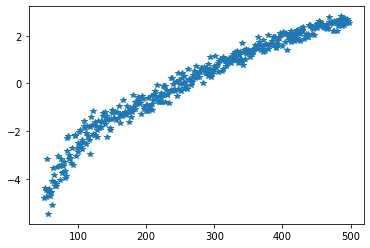

In [29]:
plt.plot(KMeans_rna_evEnr_sort.loc[:,'k'], KMeans_rna_evEnr_sort.loc[:,'sum_norm'],'*')

In [23]:
KMeans_rna_summary = misc.summary_all(mm_path='./KMeans_mm')

In [26]:
KMeans_rna_summary_sort = KMeans_rna_summary.sort_values('n_clusters')

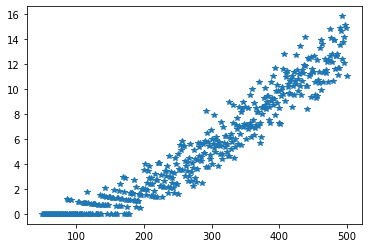

In [30]:
plt.plot(KMeans_rna_summary_sort.loc[:,'n_clusters'], KMeans_rna_summary_sort.loc[:,'n_1_cl']/KMeans_rna_summary_sort.loc[:,'n_clusters']*100,'*')

To not have too many clusters with only one gene, we will not take more than 200 clusters.

## Gene2vec

In [31]:
k_test = np.linspace(50,300,100,dtype=int)
kmeans_res = []
for k in k_test:
    kmeans = KMeans(n_clusters=k).fit(g2v)
    kmeans_res.append(kmeans.labels_  )

In [33]:
import pickle

In [34]:
file = open("KMeans_g2v_50-300.txt", "wb") 
pickle.dump([kmeans_res,k_test], file)
file.close()

In [35]:
directory = './KMeans_mm'

In [36]:
for lab in kmeans_res:
    mm = misc.lab2mat(lab, genes=g2v.index)
    k = mm.shape[1]
    mm.to_csv(os.path.join(directory,'KMeans_g2v_'+str(k)), header=False, index=True)

In [37]:
enrdir = 'Enrich'
enrich.runEnrichr_directory(mm_path = directory, mm_enrich_dir = enrdir)

Runing analysis on  KMeans_g2v_284
out_dir : ./KMeans_mm/Enrich
Cluster 130
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_284
Runing analysis on  KMeans_g2v_70
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_70
Runing analysis on  KMeans_g2v_60
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_60
Runing analysis on  KMeans_g2v_204
out_dir : ./KMeans_mm/Enrich
Cluster 188
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_204
Runing analysis on  KMeans_g2v_113
out_dir : ./KMeans_mm/Enrich
Cluster 17
Cluster 75
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_113
Runing analysis on  KMeans_g2v_196
out_dir : ./KMeans_mm/Enrich
Cluster 32
Cluster 157
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_196
Runing analysis on  KMeans_g2v_52
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_52
Runing analysis on  KMeans_g2v_115
out_dir : ./KMeans_mm/Enrich
Enrichment results 

2022-07-12 18:09:41,217 Error fetching enrichment results: GO_Biological_Process_2021


Cluster 150
Cluster 151
Cluster 152
Cluster 153
Cluster 154
Cluster 155
Cluster 160
Cluster 161
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_186
Runing analysis on  KMeans_g2v_216
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_216
Runing analysis on  KMeans_g2v_262
out_dir : ./KMeans_mm/Enrich
Cluster 9
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_262
Runing analysis on  KMeans_g2v_231
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_231
Runing analysis on  KMeans_g2v_267
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_267
Runing analysis on  KMeans_g2v_62
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_62
Runing analysis on  KMeans_g2v_183
out_dir : ./KMeans_mm/Enrich
Cluster 99
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_183
Runing analysis on  KMeans_g2v_257
out_dir : ./KMeans_mm/Enrich


2022-07-12 19:27:48,552 Error fetching enrichment results: GO_Biological_Process_2021
2022-07-12 19:27:48,749 Error fetching enrichment results: GO_Biological_Process_2021


Cluster 20
Cluster 64
Cluster 152
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_257
Runing analysis on  KMeans_g2v_85
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_85
Runing analysis on  KMeans_g2v_294
out_dir : ./KMeans_mm/Enrich
Cluster 81
Cluster 82
Cluster 86
Cluster 126


2022-07-12 20:10:42,289 Error fetching enrichment results: GO_Biological_Process_2021
2022-07-12 20:10:42,487 Error fetching enrichment results: GO_Biological_Process_2021


Cluster 272
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_294
Runing analysis on  KMeans_g2v_206
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_206
Runing analysis on  KMeans_g2v_72
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_72
Runing analysis on  KMeans_g2v_226
out_dir : ./KMeans_mm/Enrich
Cluster 175
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_226
Runing analysis on  KMeans_g2v_140
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_140
Runing analysis on  KMeans_g2v_289
out_dir : ./KMeans_mm/Enrich
Cluster 43
Cluster 146
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_289
Runing analysis on  KMeans_g2v_82
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_82
Runing analysis on  KMeans_g2v_158
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_158
Runing analysis on  KMeans_g2v_103
out_dir : 

2022-07-13 06:10:31,565 Error fetching enrichment results: GO_Biological_Process_2021
2022-07-13 06:10:31,764 Error fetching enrichment results: GO_Biological_Process_2021


Cluster 374
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_406
Runing analysis on  KMeans_g2v_92
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_92
Runing analysis on  KMeans_g2v_244
out_dir : ./KMeans_mm/Enrich
Cluster 31
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_244
Runing analysis on  KMeans_rna_432
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_432
Runing analysis on  KMeans_g2v_67
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_67
Runing analysis on  KMeans_g2v_90
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_90
Runing analysis on  KMeans_rna_479
out_dir : ./KMeans_mm/Enrich
Cluster 179
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_479
Runing analysis on  KMeans_rna_473
out_dir : ./KMeans_mm/Enrich


2022-07-13 07:57:05,100 Error fetching enrichment results: GO_Biological_Process_2021
2022-07-13 07:57:05,298 Error fetching enrichment results: GO_Biological_Process_2021


Cluster 385
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_473
Runing analysis on  KMeans_g2v_297
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_297
Runing analysis on  KMeans_rna_377
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_377
Runing analysis on  KMeans_rna_71
out_dir : ./KMeans_mm/Enrich
Cluster 10
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_71
Runing analysis on  KMeans_rna_303
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_303
Runing analysis on  KMeans_rna_131
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_131
Runing analysis on  KMeans_g2v_214
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_214
Runing analysis on  KMeans_g2v_108
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_g2v_108
Runing analysis on  KMeans_g2v_77
out_dir : ./KMeans_mm/Enrich
Enri

2022-07-13 19:02:44,342 Error fetching enrichment results: GO_Biological_Process_2021


Cluster 94
Cluster 95
Cluster 96
Cluster 97


2022-07-13 19:05:49,293 Error fetching enrichment results: GO_Biological_Process_2021


Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_447
Runing analysis on  KMeans_rna_399
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_399
Runing analysis on  KMeans_rna_434
out_dir : ./KMeans_mm/Enrich
Cluster 22
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_434
Runing analysis on  KMeans_rna_159
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_159
Runing analysis on  KMeans_rna_156
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_156
Runing analysis on  KMeans_rna_498
out_dir : ./KMeans_mm/Enrich
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_498
Runing analysis on  KMeans_rna_258
out_dir : ./KMeans_mm/Enrich
Cluster 3
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_258
Runing analysis on  KMeans_rna_276
out_dir : ./KMeans_mm/Enrich
Cluster 72
Cluster 235
Enrichment results in : ./KMeans_mm/Enrich/KMeans_rna_276
Runing analysis on  KMeans_g2v_156
out_dir :

# Clean enrichment directory

In [3]:
enr_dir = './MembMatrix/Enrich/'
for root, dirs, files in os.walk(enr_dir, topdown=False):
    if len(dirs)==0 and len(files)==0:
        os.rmdir(root)
        print('rmdir', root)
    else:
        for f in files:
            ext = f.split('.')[-1]
            if ext=='log':
                for frm in files:
                    os.remove(os.path.join(root,frm))                                    
                os.rmdir(root)
                print('rmdir', root)
            

rmdir ./MembMatrix/Enrich/KMeans_rna_200/KMeans_rna_200_88
rmdir ./MembMatrix/Enrich/SOM_rna_square_letremy_letremy_standard/SOM_rna_square_letremy_letremy_standard_14
rmdir ./MembMatrix/Enrich/HC_rna_201/HC_rna_201_116
rmdir ./MembMatrix/Enrich/HC_rna_201/HC_rna_201_120
rmdir ./MembMatrix/Enrich/HC_rna_201/HC_rna_201_185
rmdir ./MembMatrix/Enrich/HC_g2v_150/HC_g2v_150_125
rmdir ./MembMatrix/Enrich/.ipynb_checkpoints
rmdir ./MembMatrix/Enrich/KMeans_g2v_200/KMeans_g2v_200_129


In [4]:
reload(enrich)

<module 'clusterian.enrich' from '/home/ldap/ipellet/Documents/Clustering/clusterian/enrich.py'>

In [5]:
enrich.cleanEnrDir(enr_dir)

rmdir ./MembMatrix/Enrich/KMeans_rna_200/KMeans_rna_200_88
rmdir ./MembMatrix/Enrich/SOM_rna_square_letremy_letremy_standard/SOM_rna_square_letremy_letremy_standard_14
rmdir ./MembMatrix/Enrich/ICA_g2v_1e-6/ICA_g2v_1e-6_0
rmdir ./MembMatrix/Enrich/HC_rna_201/HC_rna_201_116
rmdir ./MembMatrix/Enrich/HC_rna_201/HC_rna_201_120
rmdir ./MembMatrix/Enrich/HC_rna_201/HC_rna_201_185
rmdir ./MembMatrix/Enrich/GM_g2v_200_full/GM_g2v_200_full_1
rmdir ./MembMatrix/Enrich/FLAME_g2v_no1_rcl/FLAME_g2v_no1_rcl_0
rmdir ./MembMatrix/Enrich/WGCNA_g2v_ch0.10_recl0/WGCNA_g2v_ch0.10_recl0_0
rmdir ./MembMatrix/Enrich/HC_g2v_150/HC_g2v_150_125
rmdir ./MembMatrix/Enrich/.ipynb_checkpoints
rmdir ./MembMatrix/Enrich/KMeans_g2v_200/KMeans_g2v_200_129


In [64]:
rand_enrDir = './rand_mm/Enrich/'

for root,dirs,files in os.walk(rand_enrDir):
    rand_dirs = dirs
    break
rand_dirs.remove('rand_g2v_50')

In [65]:
rand_dirs

['rand_g2v', 'rand_rna_50', 'rand_g2v30', 'rand_g2v_10', 'rand_rna_10']

In [101]:
for direct in rand_dirs:
    enrich.cleanEnrDir(os.path.join(rand_enrDir,direct))

rmdir ./rand_mm/Enrich/rand_rna_50/rand_rna_50_13280


In [99]:
reload(enrich)

<module 'clusterian.enrich' from '/home/ldap/ipellet/Documents/Clustering/clusterian/enrich.py'>

In [88]:
enrich.runEnrichr_directory(mm_path = './MembMatrix', mm_enrich_dir = 'Enrich')

Runing analysis on  ICA_rna_3_1e-1
out_dir : ./MembMatrix/Enrich
Cluster analysed : 0
Enrichment results in : ./MembMatrix/Enrich/ICA_rna_3_1e-1
Runing analysis on  ICA_g2v_10_1e-4
out_dir : ./MembMatrix/Enrich
Cluster analysed : 0
Enrichment results in : ./MembMatrix/Enrich/ICA_g2v_10_1e-4
Runing analysis on  ICA_rna_1e-2
out_dir : ./MembMatrix/Enrich
Cluster analysed : 0
Enrichment results in : ./MembMatrix/Enrich/ICA_rna_1e-2
Runing analysis on  KMeans_g2v_200
out_dir : ./MembMatrix/Enrich
Cluster analysed : 0
Enrichment results in : ./MembMatrix/Enrich/KMeans_g2v_200
Runing analysis on  SOM_rna_square_letremy_letremy_standard
out_dir : ./MembMatrix/Enrich
Cluster analysed : 0
Enrichment results in : ./MembMatrix/Enrich/SOM_rna_square_letremy_letremy_standard
Runing analysis on  WGCNA_g2v_ch0.10_recl0
out_dir : ./MembMatrix/Enrich
Cluster analysed : 0
Enrichment results in : ./MembMatrix/Enrich/WGCNA_g2v_ch0.10_recl0
Runing analysis on  HC_rna_201
out_dir : ./MembMatrix/Enrich
Clust

In [58]:
enrich.cleanEnrDir('./MembMatrix/Enrich/')

In [6]:
enrich.runEnrichr_directory(mm_path = './rand_mm', mm_enrich_dir = 'Enrich')

Runing analysis on  rand_rna_50
out_dir : ./rand_mm/Enrich
Cluster analysed : 1
Enrichment results in : ./rand_mm/Enrich/rand_rna_50
Runing analysis on  rand_rna_10
out_dir : ./rand_mm/Enrich
Cluster analysed : 0
Enrichment results in : ./rand_mm/Enrich/rand_rna_10
Runing analysis on  rand_g2v_10
out_dir : ./rand_mm/Enrich
Cluster analysed : 0
Enrichment results in : ./rand_mm/Enrich/rand_g2v_10
Runing analysis on  rand_g2v_50
out_dir : ./rand_mm/Enrich


KeyboardInterrupt: 

In [7]:
enrich.cleanEnrDir('./rand_mm/Enrich/')

rmdir ./rand_mm/Enrich/rand_g2v_50/rand_g2v_50_6572
rmdir ./rand_mm/Enrich/rand_g2v_50/rand_g2v_50_6578


In [1]:
best_4 = {'KMeans_g2v':193, 'GM_g2v':178, 'PAM_g2v':182, 'HC_g2v':21}

In [17]:
mm_files

['ICA_rna_1e-2.csv',
 'KMeans_g2v_200.csv',
 'SOM_rna_square_letremy_letremy_standard.csv',
 'WGCNA_g2v_ch0.10_recl0.csv',
 'HC_rna_201.csv',
 'KMeans_rna_200.csv',
 'GM_g2v_200_full.csv',
 'PAM_rna_200.csv',
 'SOM_g2v_square_gaussian_canberra_standard.csv',
 'PAM_g2v_200.csv',
 'HC_g2v_200.csv',
 'FLAME_g2v_6nn_1e-15.csv',
 'FLAME_rna_4n_1e-15.csv',
 'ICA_g2v_1e-6.csv',
 'GM_rna_200_full.csv',
 'WGCNA_rna_ch0.01_2rcl_rcl0.csv']

In [12]:
for s in best_4:
    mm = mm_dict[s]
    print(s, ':', mm.index[mm[best_4[s]]==1].values)

KMeans_g2v : ['UGT1A4' 'UGT1A8' 'UGT1A5' 'UGT1A7']
GM_g2v : ['UGT1A4' 'UGT1A8' 'UGT1A5' 'UGT1A7']
PAM_g2v : ['UGT1A4' 'UGT1A8' 'UGT1A5' 'UGT1A7']
HC_g2v : ['UGT1A4' 'UGT1A8' 'UGT1A5' 'UGT1A7']


In [15]:
UGT1 =  mm.index[mm[best_4[s]]==1].values

In [19]:
other_sol = ['WGCNA_g2v', 'SOM_g2v', 'FLAME_g2v', 'ICA_g2v']
for s in other_sol:
    mm = mm_dict[s]
    print(s)
    for g in UGT1:
        print(g, 'in cluster(s)', mm.columns[mm.loc[g,:]==1].values)

WGCNA_g2v
UGT1A4 in cluster(s) [385]
UGT1A8 in cluster(s) [385]
UGT1A5 in cluster(s) [385]
UGT1A7 in cluster(s) [132]
SOM_g2v
UGT1A4 in cluster(s) [14]
UGT1A8 in cluster(s) [14]
UGT1A5 in cluster(s) [14]
UGT1A7 in cluster(s) [14]
FLAME_g2v
UGT1A4 in cluster(s) [223]
UGT1A8 in cluster(s) [223]
UGT1A5 in cluster(s) [223]
UGT1A7 in cluster(s) [223]
ICA_g2v
UGT1A4 in cluster(s) [  6  13  17  20  23  28  29  30  33  37  41  42  43  44  47  49  50  51
  52  54  55  58  63  66  68  69  70  82  84  87  91  95  99 102 106 108
 109 111 113 114 119 123 124 131 132 135 138 142 143 144 145 155 160 165
 173 174 176 180 183 187 194 197]
UGT1A8 in cluster(s) [  6  10  13  17  25  26  28  30  35  37  41  42  43  44  46  47  49  51
  54  58  63  66  68  77  84  86  91  92  95  98  99 102 103 105 106 108
 114 119 123 124 126 128 129 131 132 133 134 135 142 145 155 157 158 173
 176 177 180 181 187 192]
UGT1A5 in cluster(s) [  1   3   6  14  17  20  24  29  30  34  38  41  42  43  44  47  49  51
  52  58  

In [36]:
mm = mm_dict['FLAME_g2v']
mm.index[mm[223]==1]

Index(['BC038194', 'TTTY1B', 'CPZ', 'NBPF11', 'NBPF14', 'NBPF15', 'NBPF19',
       'NBPF25P', 'NBPF8', 'CLDN22',
       ...
       'SPON2', 'BATF2', 'RP11-308D16.4', 'ACTR3P2', 'RP11-680F8.4',
       'LOC101929761', 'NLRP7', 'PRR12', 'RPA4', 'KRTAP21-1'],
      dtype='object', name=0, length=1045)

In [342]:
enr_dir = './MembMatrix/Enrich/PAM_rna_200'
cl = 190
enr = enrich.getEnrich_cl(enr_dir, cl, score_th=None, pval=0.05, mm=None, ovlp_th=0.1)

In [343]:
enr[0]

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,Overlap Num
0,GO_Biological_Process_2021,positive regulation of defense response to bac...,2/8,8.396276e-07,0.000013,0,0,3331.666667,46611.040785,KLK5;KLK7,0.250000
1,GO_Biological_Process_2021,positive regulation of G protein-coupled recep...,2/19,5.124080e-06,0.000038,0,0,1175.235294,14316.198633,KLK5;KLK6,0.105263


In [344]:
enr[1]

array(['KLK5', 'KLK6', 'KLK7'], dtype='<U4')

In [100]:
bestCl_rna = {'WGCNA_rna':191}
for s in bestCl_rna:
    mm = mm_dict[s]
    cl = bestCl_rna[s]
    genes = mm.index[mm[cl]==1].values
    print(genes)

['PCDHB4' 'PCDHB2' 'PCDHB3' 'PCDHB5' 'PCDHB6' 'PCDHB7' 'PCDHB8' 'PCDHB10'
 'PCDHB14' 'PCDHB12' 'EFNB2' 'PCDHB13' 'PCDHB11' 'PCDHA9' 'PCDHA10']


In [101]:
len(genes)

15

In [102]:
enr_dir = './MembMatrix/Enrich/WGCNA_rna_ch0.01_2rcl_rcl0'
enr = enrich.getEnrich_cl(enr_dir, cl, score_th=1e3, pval=0.05, mm=None, ovlp_th=0.25)

In [105]:
enr[0].iat[0,-2]

'PCDHB2;PCDHB6;PCDHB14;PCDHB5;PCDHB13;PCDHB4;PCDHB3;PCDHB11;PCDHB10'

In [96]:
g

<AxesSubplot:ylabel='Count'>

In [77]:
enr[1]

array(['KLK5', 'KLK6', 'KLK7'], dtype='<U4')

In [78]:
genes

array(['KLK10', 'KLK5', 'KLK6', 'KLK7'], dtype=object)

In [70]:
count=0
for g in genes:
    if g[0:5]=='PCDHB' :
        count+=1
    else:
        print(g)
count

EFNB2
PCDHA9
PCDHA10


12

EIF : Eukaryotic Translation Initiation Factor (3)
EEF : Eukaryotic Translation Elongation Factor (2)
GSPT1 : Enables translation release factor activity. Involved in regulation of translational termination. 
Transcription-factor related : 2